In [1]:
from __future__ import division
import os
import time
from glob import glob
import tensorflow as tf
from six.moves import xrange

from tflib.save_images import *

In [2]:
data_dir = './data'
import helper

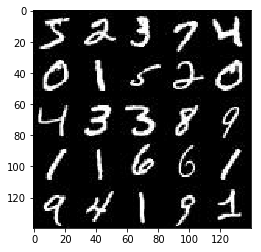

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

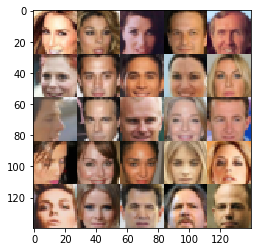

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

"""
# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
"""

"\n# Check TensorFlow Version\nassert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)\nprint('TensorFlow Version: {}'.format(tf.__version__))\n\n# Check for a GPU\nif not tf.test.gpu_device_name():\n    warnings.warn('No GPU found. Please use a GPU to train your neural network.')\nelse:\n    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))\n"

In [6]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_imgs = tf.placeholder(tf.float32, [None, image_width,image_height,image_channels], name='input_real')
    inputs_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    return real_imgs, inputs_z, learning_rate

In [7]:
HIDDEN_DIM = 1024
INPUT_DIM = 28 * 28 * 1
IMAGE_SHAPE = [28, 28, 1]

## Encoder

In [8]:
def encoder(images, z_dim, leaky_factor=0.2, name='encoder', reuse=False):
    """
    Create the encoder network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :leaky_factor: leaky_factor for leaky relu layer
    :return: Tensor of output vector (latent z )
    """
    with tf.variable_scope(name, reuse=reuse):

        # Flatten it
        #norm = tf.random_normal_initializer(stddev=0.01)
        x1 = tf.contrib.layers.flatten(images)
        x1 = tf.layers.dense(x1, HIDDEN_DIM)
        x1 = tf.layers.batch_normalization(x1, training=(not reuse))
        relu1 = tf.maximum(leaky_factor * x1, x1)
        
        x2 = tf.layers.dense(relu1, HIDDEN_DIM)
        x2 = tf.layers.batch_normalization(x2, training=(not reuse))
        relu2 = tf.maximum(leaky_factor * x2, x2)
        
        out = tf.layers.dense(relu2, z_dim)
        return out

## Decoder

In [9]:
def decoder(z, out_channel_dim, leaky_factor=0.2, name='decoder',is_train=True):
    """
    Create the decoder network
    :param images: Tensor of input z
    :param out_channel_dim: the output channel format
    :param leaky_factor: leaky_factor for leaky relu layer
    :param is_train: Boolean if it is train mode or test mode
    :return: Tensor of output vector (latent z )
    """    
    with tf.variable_scope(name, reuse= (not is_train)):
        x1 = tf.layers.dense(z, HIDDEN_DIM)
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = tf.maximum(leaky_factor * x1, x1)
        
        x2 = tf.layers.dense(relu1, HIDDEN_DIM)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = tf.maximum(leaky_factor * x2, x2)
        
        out = tf.tanh(tf.layers.dense(relu2, INPUT_DIM))
        return tf.reshape(out, [-1] + IMAGE_SHAPE)

## Discriminator

In [10]:
def discriminator(input_z, leaky_factor=0.2, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input z
    :param leaky_factor: leaky_factor for leaky relu layer
    :param reuse: Boolean if it is train mode or test mode
    :return: tuple of (classification result, logits)
    """     
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x1 = tf.layers.dense(input_z, HIDDEN_DIM)
        x1 = tf.layers.batch_normalization(x1, training=(not reuse))
        relu1 = tf.maximum(leaky_factor * x1, x1)

        x2 = tf.layers.dense(relu1, HIDDEN_DIM)
        x2 = tf.layers.batch_normalization(x2, training=(not reuse))
        relu2 = tf.maximum(leaky_factor * x2, x2)

        logits = tf.layers.dense(x2, 1)
        out = tf.sigmoid(logits)

        return out, logits

## Corruptor

In [11]:
def corrupt(images, mask_type='inpainting',noise=False):
    """
    Create the discriminator network
    :param images: Tensor of input images
    :param noise: Boolean if gaussian noise will be added
    :return: Tensor of corrupted images
    """ 
    image_shape = images.get_shape().as_list()[1:]
    x, y, z = image_shape
    length_input = x * y * z
    mu = 0.0
    sigma = 0.1
    gnoise = np.random.normal(loc=mu, scale=sigma, size=image_shape)
    if noise:
        images = tf.add(images, gnoise)
        
    if mask_type == 'inpainting':
        # inpainting 
        a, b = 2, 2
        pixFrac = np.random.beta(a,b)
        #pixFrac = 0.5
        mask = np.random.binomial(1, pixFrac, image_shape)
        result = tf.multiply(images, mask)
        return result
    elif mask_type == 'compress':
        # compressive sensing
        flat_images = tf.contrib.layers.flatten(images)
        #A = np.random.normal(loc=mu, scale=sigma,size=[length_input//5, length_input])
        #A = np.array(A, dtype=np.float32)
        #mask = np.matmul(A.transpose(), A)
        A = tf.random_normal([length_input // 5, length_input], name='sensing_matrix')
        mask = tf.matmul(tf.transpose(A), A)
        result = tf.matmul(flat_images, mask)
        return tf.reshape(result, [-1] + image_shape)
    else:
        return images

### Loss
Implement `model_loss` to build the DAAE for training and calculate the loss.  The function should return a tuple of (discriminator loss, encoder loss, encoder-decoder loss).  Use the following functions you implemented:
- `discriminator(input_z, leaky_factor, reuse=False)`
- `decoder(z, out_channel_dim, leaky_factor, is_train=True)`
- `encoder(images, z_dim, leaky_factor, reuse=False)`

In [33]:
def model_loss(input_real, input_z, z_dim, output_channel_dim, M):
    """
    Get the loss for the discriminator, encoder and decoder
    :param input_real: Images from the real dataset
    :param input_z: Z input from Laplacian distribution
    :param out_channel_dim: The number of channels in the output image
    :param M : how many iterations to sample from p(z|x)
    :return: A tuple of (discriminator loss, encoder loss, recon loss, dis_loss_sum, en_loss_sum, recon_loss_sum)
    """
    
    #En = encoder(input_real, z_dim)
    #d_out_real, d_logits_real = discriminator(En)  

    
    corr_images = corrupt(input_real, mask_type='', noise=True)
    encorr = encoder(corr_images, z_dim)
    #d_out_fake, d_logits_fake = discriminator(encorr, reuse=True)
    
    De_corr = decoder(encorr, output_channel_dim)
    #recon_loss = tf.reduce_mean(tf.square(tf.subtract(De_corr, input_real)))
    recon_loss = tf.reduce_mean(
            tf.nn.sigmoid_cross_entropy_with_logits(
                logits=De_corr,
                labels=input_real))
    
    
    fake_z = tf.zeros_like(encorr, name='fake_z')
    for i in range(M):
        corr_images = corrupt(input_real, mask_type='', noise=True)
        encorr = encoder(corr_images, z_dim, reuse=True)
        #temp_en_loss += tf.square(tf.subtract(encorr, En))
        #d_out_fake_temp, d_logits_fake_temp = discriminator(encorr, reuse=True)
        #d_logits_fake += d_logits_fake_temp
        fake_z += encorr

    #temp_en_loss /= M
    #temp_en_loss = tf.reduce_mean(temp_en_loss)
    #d_logits_fake /=M
    fake_z /= M
    fake_z_sum = tf.summary.histogram("fake_z",fake_z)
    
    d_out_real, d_logits_real = discriminator(input_z)
    d_out_fake, d_logits_fake = discriminator(fake_z, reuse=True)
    #d_out_real, d_logits_real = discriminator(input_z, reuse=True)
    #d_out_real, d_logits_real = discriminator(En, reuse=True)
    
    
    d_loss_fake = tf.reduce_mean(
            tf.nn.sigmoid_cross_entropy_with_logits(
                logits=d_logits_fake,
                labels=tf.zeros_like(d_out_fake)))

    d_loss_real = tf.reduce_mean(
            tf.nn.sigmoid_cross_entropy_with_logits(
                logits=d_logits_real,
                labels=tf.ones_like(d_out_real)))

    dis_loss = d_loss_fake + d_loss_real
    
    
    temp_en_loss_dis = tf.reduce_mean(
            tf.nn.sigmoid_cross_entropy_with_logits(
                logits=d_logits_fake,
                labels=tf.ones_like(d_out_fake)))
    en_loss =  temp_en_loss_dis #+ recon_loss
    
    
    temp_en_loss_sum = tf.summary.histogram("temp_en_loss_dis", temp_en_loss_dis)
    dis_loss_sum = tf.summary.scalar("dis_loss", dis_loss)
    recon_loss_sum = tf.summary.scalar("recon_loss", recon_loss)
    en_loss_sum = tf.summary.scalar("en_loss", en_loss)
    
    return dis_loss, en_loss, temp_en_loss_dis, recon_loss, dis_loss_sum, en_loss_sum, recon_loss_sum, fake_z_sum,temp_en_loss_sum
    
    

In [34]:
def model_opt(dis_loss, en_loss, recon_loss, learning_rate, beta1, beta2):
    """
    Get optimization operations
    :param dis_loss: Discriminator loss Tensor
    :param en_loss: encoder loss Tensor
    :param recon_loss: reconstruction loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param beta2: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, encoder training operation, recontraining operations)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    
    dis_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    de_vars = [var for var in t_vars if var.name.startswith('decoder')]
    en_vars = [var for var in t_vars if var.name.startswith('encoder')]
    ed_vars = de_vars + en_vars
    
    
    #with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='decoder')):
    de_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1,beta2=beta2).minimize(recon_loss, var_list=ed_vars)
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1,beta2=beta2).minimize(dis_loss, var_list=dis_vars)
    
    #with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='encoder')):
    en_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1,beta2=beta2).minimize(en_loss, var_list=en_vars)
    
    return d_train_opt, en_train_opt, de_train_opt





## Training

In [35]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np
import scipy.stats as stats

def sample_from_dis(n_images, z_dim,dis = 'laplacian'):
    if dis == 'laplacian':
        mu = 0.0
        lam = 1.0
        return np.random.laplace(loc=mu, scale=lam, size=[n_images, z_dim])
    elif dis == 'gaussian':
        mu = 0
        lower = -1
        upper = 1
        sigma = 1 / np.sqrt(z_dim)
        sigma = 1
        z = stats.truncnorm.rvs((lower-mu)/sigma, (upper-mu)/sigma, loc=mu, scale=sigma, size=[n_images,z_dim])
        return z
    else:
        return np.random.uniform(-1, 1, size=[n_images, z_dim])


def show_decoder_output(sess, n_images, input_z, out_channel_dim, image_mode, distribution='laplacian'):
    """
    Show example output for the decoder
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
        
    example_z = sample_from_dis(n_images, z_dim, dis=None)

    samples = sess.run(
        decoder(input_z, out_channel_dim, leaky_factor=0.2, is_train = False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()
    
    
def show_endecoder_output(sess, sample_images, input_real,input_z, out_channel_dim, image_mode, distribution='laplacian'):
    """
    Show example output for the encoder-decoder
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
        
    #example_z = sample_from_dis(n_images, z_dim, dis=distribution)
    corrupt_img = corrupt(input_real,mask_type='', noise=True)
    ops = [corrupt_img, decoder(encoder(corrupt_img, z_dim, leaky_factor=0.2, reuse=True), out_channel_dim,
                  leaky_factor=0.2, is_train = False)]
    
    #corrupt_images = sess.run(corrupt(input_real, mask_type='inpainting',noise=False), feed_dict={input_real:sample_images})
    
    corrupt_images, samples = sess.run(
        ops,
        feed_dict={input_real: sample_images})
    
    mse = np.mean((samples - sample_images) ** 2)
    print("######### what? the reconstruction mse is: %2.4f"  % mse)

    images_grid = helper.images_square_grid(samples, image_mode)
    corr_grid = helper.images_square_grid(corrupt_images, image_mode)
    
    pyplot.subplot(121)
    pyplot.imshow(corr_grid, cmap=cmap)
    
    pyplot.subplot(122)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()
    
    

## run

In [36]:
import time

checkpoint_dir = './checkpoint'
model_name = "DAAE.model"

def save(saver, sess, checkpoint_dir, model_name, steps):
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    saver.save(sess,os.path.join(checkpoint_dir, model_name),
                        global_step=steps)

    
def load(saver, sess, checkpoint_dir):
    print(" [*] Reading checkpoints...")

    ckpt = tf.train.get_checkpoint_state(checkpoint_dir)
    if ckpt and ckpt.model_checkpoint_path:
        saver.restore(sess, ckpt.model_checkpoint_path)
        return True
    else:
        return False



def train(epoch_count, batch_size, z_dim, learning_rate, beta1, beta2, M, get_batches, samples, data_shape, data_image_mode):
    """
    Train the DAAE
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param beta2: The exponential decay rate for the 1st moment in the optimizer
    :param M: iterations to sample fake_z
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    num_imgs, image_width, image_height, image_channels = data_shape
    
    input_real, input_z, _ = model_inputs(image_width, image_height, image_channels, z_dim)
    #tf.assign(lr, learning_rate)
    output_channel_dim = image_channels
    
    result = model_loss(input_real, input_z, z_dim, output_channel_dim, M)
    dis_loss, en_loss, temp_en_loss, recon_loss, dis_loss_sum, en_loss_sum, recon_loss_sum,fake_z_sum,temp_en_loss_sum = result
    
    d_train_opt, en_train_opt, de_train_opt = model_opt(dis_loss, en_loss, recon_loss, learning_rate, beta1,beta2)
    ITER = 3 # we can train decoder more than 1 time...later~
    steps = 0
    
    recon_sum = tf.summary.merge([recon_loss_sum])
    en_sum = tf.summary.merge([fake_z_sum,en_loss_sum])
    dis_sum = tf.summary.merge([dis_loss_sum])

    saver = tf.train.Saver(max_to_keep=1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        writer = tf.summary.FileWriter("./logs", sess.graph)
        
        # check if already exists a model
        if load(saver, sess, checkpoint_dir):
            print("""
            We found a existing model and continue to train on it! 
            If you need a new model, delete checkpoint directory""")
        else:
            print("""NOT found a model === Initializing a new one""")
            
        en_val = 1
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                batch_z = sample_from_dis(batch_size, z_dim,dis = '')

                # Run optimizers
                
                # Update Discriminator network
                if en_val < 0.75:
                    _, summary_str = sess.run([d_train_opt, dis_sum],
                        feed_dict={ input_real: batch_images, input_z: batch_z })
                    writer.add_summary(summary_str, steps)
                
                
                    
                # Update the Encoder network
                #for i in range(ITER):
                _, summary_str = sess.run([en_train_opt, en_sum],
                            feed_dict={input_real: batch_images})
                writer.add_summary(summary_str, steps)
               
                # Update Decoder network
                for i in range(ITER):
                    _, summary_str = sess.run([de_train_opt, recon_sum],
                            feed_dict={ input_real: batch_images})
                writer.add_summary(summary_str, steps)


                
                if steps % 10 == 0:
                    ops = [dis_loss, en_loss,temp_en_loss, recon_loss]
                    dis_val,en_val,temp_en_val,recon_val = sess.run(ops, feed_dict={input_real:batch_images, input_z:batch_z})
                    print("dis_loss: %.8f, en_loss: %.8f, temp_en_loss_dis: %.8f, recon_loss: %2.4f" % (dis_val, en_val, temp_en_val,recon_val))
                    
                if steps % 100 == 0:
                    #show_decoder_output(sess, show_n_images, input_z, output_channel_dim, data_image_mode)
                    show_endecoder_output(sess, samples, input_real,input_z, output_channel_dim, data_image_mode)
                    
                if steps % 500 == 1:
                    save(saver, sess, checkpoint_dir, model_name, steps)
                    
                    

## Test!

(59975, 28, 28, 1)
 [*] Reading checkpoints...
NOT found a model === Initializing a new one
dis_loss: 8.68368912, en_loss: 0.00060775, temp_en_loss_dis: 0.00060775, recon_loss: -0.3593
dis_loss: 3.60826707, en_loss: 0.07796979, temp_en_loss_dis: 0.07796979, recon_loss: -0.4522
dis_loss: 1.89793420, en_loss: 0.52940917, temp_en_loss_dis: 0.52940917, recon_loss: -0.4637
dis_loss: 1.00685370, en_loss: 1.69236231, temp_en_loss_dis: 1.69236231, recon_loss: -0.4382
dis_loss: 3.91203713, en_loss: 0.05537867, temp_en_loss_dis: 0.05537867, recon_loss: -0.4726
dis_loss: 0.88942230, en_loss: 1.93797112, temp_en_loss_dis: 1.93797112, recon_loss: -0.4739
dis_loss: 2.04218626, en_loss: 0.40551192, temp_en_loss_dis: 0.40551192, recon_loss: -0.4642
dis_loss: 0.86745930, en_loss: 1.75982213, temp_en_loss_dis: 1.75982213, recon_loss: -0.4701
dis_loss: 1.43292725, en_loss: 0.75668526, temp_en_loss_dis: 0.75668526, recon_loss: -0.4697
dis_loss: 2.84448552, en_loss: 0.13852301, temp_en_loss_dis: 0.13852301

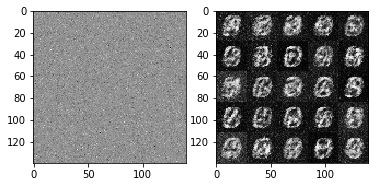

dis_loss: 0.86716831, en_loss: 1.63713002, temp_en_loss_dis: 1.63713002, recon_loss: -0.4772
dis_loss: 1.54903698, en_loss: 0.60802007, temp_en_loss_dis: 0.60802007, recon_loss: -0.4894
dis_loss: 0.87440425, en_loss: 1.52942753, temp_en_loss_dis: 1.52942753, recon_loss: -0.5074
dis_loss: 1.39947069, en_loss: 0.75997502, temp_en_loss_dis: 0.75997502, recon_loss: -0.4696
dis_loss: 2.34886646, en_loss: 0.21317500, temp_en_loss_dis: 0.21317500, recon_loss: -0.4854
dis_loss: 0.86173677, en_loss: 1.52789664, temp_en_loss_dis: 1.52789664, recon_loss: -0.4773
dis_loss: 1.71059513, en_loss: 0.44944274, temp_en_loss_dis: 0.44944274, recon_loss: -0.4713
dis_loss: 0.81441164, en_loss: 1.58974016, temp_en_loss_dis: 1.58974016, recon_loss: -0.5020
dis_loss: 1.37107086, en_loss: 0.69737685, temp_en_loss_dis: 0.69737685, recon_loss: -0.4634
dis_loss: 0.78433001, en_loss: 1.67234445, temp_en_loss_dis: 1.67234445, recon_loss: -0.4810
######### what? the reconstruction mse is: 2.6271


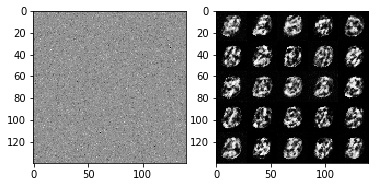

dis_loss: 1.41409850, en_loss: 0.71769983, temp_en_loss_dis: 0.71769983, recon_loss: -0.5133
dis_loss: 0.74253929, en_loss: 1.69823170, temp_en_loss_dis: 1.69823170, recon_loss: -0.4978
dis_loss: 1.51369798, en_loss: 0.57455355, temp_en_loss_dis: 0.57455355, recon_loss: -0.5030
dis_loss: 0.69196606, en_loss: 1.82232428, temp_en_loss_dis: 1.82232428, recon_loss: -0.4966
dis_loss: 1.35704803, en_loss: 0.76054144, temp_en_loss_dis: 0.76054144, recon_loss: -0.4626
dis_loss: 2.56954360, en_loss: 0.16090316, temp_en_loss_dis: 0.16090316, recon_loss: -0.4992
dis_loss: 0.61885077, en_loss: 1.99981606, temp_en_loss_dis: 1.99981606, recon_loss: -0.4806
dis_loss: 1.43116474, en_loss: 0.58496118, temp_en_loss_dis: 0.58496118, recon_loss: -0.4923
dis_loss: 0.60065842, en_loss: 2.07791233, temp_en_loss_dis: 2.07791233, recon_loss: -0.5046
dis_loss: 1.01802516, en_loss: 0.96607363, temp_en_loss_dis: 0.96607363, recon_loss: -0.5074
######### what? the reconstruction mse is: 2.6977


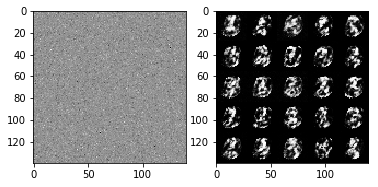

dis_loss: 1.99867415, en_loss: 0.26496917, temp_en_loss_dis: 0.26496917, recon_loss: -0.4932
dis_loss: 0.55770707, en_loss: 2.07311559, temp_en_loss_dis: 2.07311559, recon_loss: -0.4308
dis_loss: 1.27108872, en_loss: 0.66946322, temp_en_loss_dis: 0.66946322, recon_loss: -0.4921
dis_loss: 0.54910809, en_loss: 2.11192584, temp_en_loss_dis: 2.11192584, recon_loss: -0.4912
dis_loss: 1.08074951, en_loss: 0.86237931, temp_en_loss_dis: 0.86237931, recon_loss: -0.4889
dis_loss: 2.31274605, en_loss: 0.19086963, temp_en_loss_dis: 0.19086963, recon_loss: -0.5030
dis_loss: 0.52414876, en_loss: 2.12349772, temp_en_loss_dis: 2.12349772, recon_loss: -0.4892
dis_loss: 1.24075675, en_loss: 0.72240019, temp_en_loss_dis: 0.72240019, recon_loss: -0.4878
dis_loss: 0.47841173, en_loss: 2.27621126, temp_en_loss_dis: 2.27621126, recon_loss: -0.4751
dis_loss: 0.96256119, en_loss: 0.99541813, temp_en_loss_dis: 0.99541813, recon_loss: -0.5110
######### what? the reconstruction mse is: 2.7029


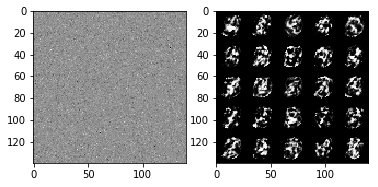

dis_loss: 2.15779400, en_loss: 0.25042209, temp_en_loss_dis: 0.25042209, recon_loss: -0.4778
dis_loss: 0.44904965, en_loss: 2.28171635, temp_en_loss_dis: 2.28171635, recon_loss: -0.4908
dis_loss: 0.99153674, en_loss: 0.85597628, temp_en_loss_dis: 0.85597628, recon_loss: -0.4977
dis_loss: 2.17389870, en_loss: 0.20265679, temp_en_loss_dis: 0.20265679, recon_loss: -0.4596
dis_loss: 0.43270153, en_loss: 2.30554724, temp_en_loss_dis: 2.30554724, recon_loss: -0.4813
dis_loss: 0.88497716, en_loss: 1.02478123, temp_en_loss_dis: 1.02478123, recon_loss: -0.4864
dis_loss: 1.70031118, en_loss: 0.31573972, temp_en_loss_dis: 0.31573972, recon_loss: -0.4962
dis_loss: 0.42078972, en_loss: 2.26966357, temp_en_loss_dis: 2.26966357, recon_loss: -0.5114
dis_loss: 0.98589551, en_loss: 0.82416761, temp_en_loss_dis: 0.82416761, recon_loss: -0.4872
dis_loss: 2.40573931, en_loss: 0.14325011, temp_en_loss_dis: 0.14325011, recon_loss: -0.4995
######### what? the reconstruction mse is: 2.7082


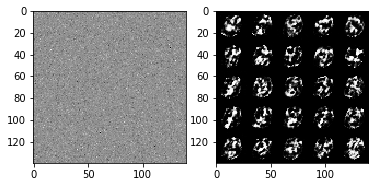

dis_loss: 0.41456819, en_loss: 2.18625784, temp_en_loss_dis: 2.18625784, recon_loss: -0.4863
dis_loss: 1.01114047, en_loss: 0.73073590, temp_en_loss_dis: 0.73073590, recon_loss: -0.5082
dis_loss: 0.38053530, en_loss: 2.40306997, temp_en_loss_dis: 2.40306997, recon_loss: -0.5006
dis_loss: 0.87669623, en_loss: 0.89387524, temp_en_loss_dis: 0.89387524, recon_loss: -0.4785
dis_loss: 2.30366921, en_loss: 0.16297781, temp_en_loss_dis: 0.16297781, recon_loss: -0.4960
dis_loss: 0.39064151, en_loss: 2.16392112, temp_en_loss_dis: 2.16392112, recon_loss: -0.5040
dis_loss: 1.09352350, en_loss: 0.61229122, temp_en_loss_dis: 0.61229122, recon_loss: -0.5073
dis_loss: 0.32997102, en_loss: 2.70821857, temp_en_loss_dis: 2.70821857, recon_loss: -0.5033
dis_loss: 0.81425345, en_loss: 0.93634343, temp_en_loss_dis: 0.93634343, recon_loss: -0.4967
dis_loss: 2.11860538, en_loss: 0.17870583, temp_en_loss_dis: 0.17870583, recon_loss: -0.4696
######### what? the reconstruction mse is: 2.6705


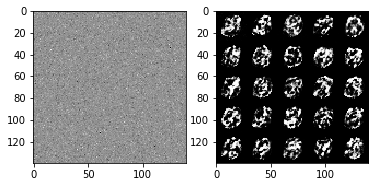

dis_loss: 0.35854712, en_loss: 2.27685165, temp_en_loss_dis: 2.27685165, recon_loss: -0.4896
dis_loss: 1.16928196, en_loss: 0.59935457, temp_en_loss_dis: 0.59935457, recon_loss: -0.4847
dis_loss: 0.30268526, en_loss: 2.65784144, temp_en_loss_dis: 2.65784144, recon_loss: -0.4821
dis_loss: 0.86426133, en_loss: 0.94754815, temp_en_loss_dis: 0.94754815, recon_loss: -0.4777
dis_loss: 2.16712928, en_loss: 0.17830139, temp_en_loss_dis: 0.17830139, recon_loss: -0.5020
dis_loss: 0.32229567, en_loss: 2.34990525, temp_en_loss_dis: 2.34990525, recon_loss: -0.4904
dis_loss: 1.14320421, en_loss: 0.54464120, temp_en_loss_dis: 0.54464120, recon_loss: -0.4775
dis_loss: 0.27613175, en_loss: 2.77250624, temp_en_loss_dis: 2.77250624, recon_loss: -0.4746
dis_loss: 0.76320010, en_loss: 0.96132350, temp_en_loss_dis: 0.96132350, recon_loss: -0.4959
dis_loss: 2.16737366, en_loss: 0.16591802, temp_en_loss_dis: 0.16591802, recon_loss: -0.4978
######### what? the reconstruction mse is: 2.7058


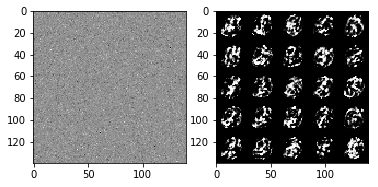

dis_loss: 0.28951952, en_loss: 2.50265551, temp_en_loss_dis: 2.50265551, recon_loss: -0.4746
dis_loss: 1.05202246, en_loss: 0.61634421, temp_en_loss_dis: 0.61634421, recon_loss: -0.4707
dis_loss: 0.24398363, en_loss: 2.94220304, temp_en_loss_dis: 2.94220304, recon_loss: -0.4856
dis_loss: 0.61024874, en_loss: 1.27458024, temp_en_loss_dis: 1.27458024, recon_loss: -0.4945
dis_loss: 1.48989129, en_loss: 0.34639388, temp_en_loss_dis: 0.34639388, recon_loss: -0.4898
dis_loss: 0.25189996, en_loss: 2.71056628, temp_en_loss_dis: 2.71056628, recon_loss: -0.5110
dis_loss: 0.89892924, en_loss: 0.72261119, temp_en_loss_dis: 0.72261119, recon_loss: -0.4783
dis_loss: 0.23622972, en_loss: 3.03182960, temp_en_loss_dis: 3.03182960, recon_loss: -0.5216
dis_loss: 0.56004524, en_loss: 1.29048991, temp_en_loss_dis: 1.29048991, recon_loss: -0.4667
dis_loss: 1.77425122, en_loss: 0.24885462, temp_en_loss_dis: 0.24885462, recon_loss: -0.5104
######### what? the reconstruction mse is: 2.7499


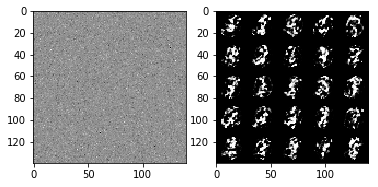

dis_loss: 0.23718496, en_loss: 2.66412783, temp_en_loss_dis: 2.66412783, recon_loss: -0.5132
dis_loss: 1.22483051, en_loss: 0.47725320, temp_en_loss_dis: 0.47725320, recon_loss: -0.4966
dis_loss: 0.20384848, en_loss: 3.19222212, temp_en_loss_dis: 3.19222212, recon_loss: -0.5187
dis_loss: 0.54806376, en_loss: 1.45816731, temp_en_loss_dis: 1.45816731, recon_loss: -0.4990
dis_loss: 1.17228746, en_loss: 0.49484655, temp_en_loss_dis: 0.49484655, recon_loss: -0.4786
dis_loss: 0.22346798, en_loss: 2.84535551, temp_en_loss_dis: 2.84535551, recon_loss: -0.4989
dis_loss: 1.02485502, en_loss: 0.60154414, temp_en_loss_dis: 0.60154414, recon_loss: -0.4991
dis_loss: 0.19879825, en_loss: 3.00295067, temp_en_loss_dis: 3.00295067, recon_loss: -0.4802
dis_loss: 0.72707450, en_loss: 0.87103611, temp_en_loss_dis: 0.87103611, recon_loss: -0.4802
dis_loss: 2.33919048, en_loss: 0.12426245, temp_en_loss_dis: 0.12426245, recon_loss: -0.5014
######### what? the reconstruction mse is: 2.7489


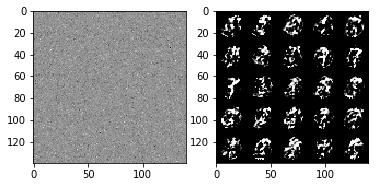

dis_loss: 0.21494073, en_loss: 2.67087507, temp_en_loss_dis: 2.67087507, recon_loss: -0.5027
dis_loss: 1.32070279, en_loss: 0.40419263, temp_en_loss_dis: 0.40419263, recon_loss: -0.4920
dis_loss: 0.17214431, en_loss: 3.22077942, temp_en_loss_dis: 3.22077942, recon_loss: -0.4969
dis_loss: 0.44907007, en_loss: 1.45852304, temp_en_loss_dis: 1.45852304, recon_loss: -0.4966
dis_loss: 1.15325797, en_loss: 0.48093158, temp_en_loss_dis: 0.48093158, recon_loss: -0.4784
dis_loss: 0.19440652, en_loss: 2.79442525, temp_en_loss_dis: 2.79442525, recon_loss: -0.5171
dis_loss: 1.25695324, en_loss: 0.41794014, temp_en_loss_dis: 0.41794014, recon_loss: -0.5091
dis_loss: 0.16062808, en_loss: 3.32476854, temp_en_loss_dis: 3.32476854, recon_loss: -0.5247
dis_loss: 0.47697029, en_loss: 1.34427071, temp_en_loss_dis: 1.34427071, recon_loss: -0.5096
dis_loss: 1.34424579, en_loss: 0.37519947, temp_en_loss_dis: 0.37519947, recon_loss: -0.4800
######### what? the reconstruction mse is: 2.7260


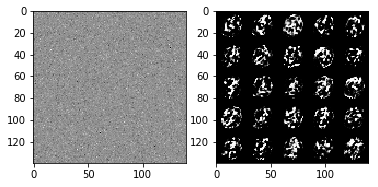

dis_loss: 0.17225775, en_loss: 3.04230785, temp_en_loss_dis: 3.04230785, recon_loss: -0.4837
dis_loss: 0.94941860, en_loss: 0.60670543, temp_en_loss_dis: 0.60670543, recon_loss: -0.5047
dis_loss: 0.15253389, en_loss: 3.25813222, temp_en_loss_dis: 3.25813222, recon_loss: -0.4911
dis_loss: 0.44591361, en_loss: 1.38344634, temp_en_loss_dis: 1.38344634, recon_loss: -0.4843
dis_loss: 1.41516638, en_loss: 0.33786461, temp_en_loss_dis: 0.33786461, recon_loss: -0.5108
dis_loss: 0.17011623, en_loss: 2.90369964, temp_en_loss_dis: 2.90369964, recon_loss: -0.5005
dis_loss: 1.06719565, en_loss: 0.51888096, temp_en_loss_dis: 0.51888096, recon_loss: -0.5089
dis_loss: 0.12953866, en_loss: 3.58360672, temp_en_loss_dis: 3.58360672, recon_loss: -0.4806
dis_loss: 0.41912925, en_loss: 1.41544628, temp_en_loss_dis: 1.41544628, recon_loss: -0.4858
dis_loss: 1.39126623, en_loss: 0.34186238, temp_en_loss_dis: 0.34186238, recon_loss: -0.5075
######### what? the reconstruction mse is: 2.7446


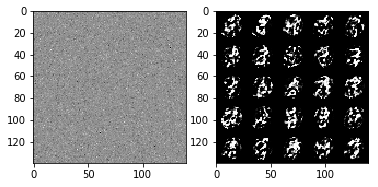

dis_loss: 0.16076326, en_loss: 2.87485123, temp_en_loss_dis: 2.87485123, recon_loss: -0.4943
dis_loss: 1.51397192, en_loss: 0.30162847, temp_en_loss_dis: 0.30162847, recon_loss: -0.5020
dis_loss: 0.13173866, en_loss: 3.37744999, temp_en_loss_dis: 3.37744999, recon_loss: -0.4579
dis_loss: 0.58957136, en_loss: 1.00382292, temp_en_loss_dis: 1.00382292, recon_loss: -0.4953
dis_loss: 2.08284426, en_loss: 0.16572355, temp_en_loss_dis: 0.16572355, recon_loss: -0.4814
dis_loss: 0.14765383, en_loss: 3.04502773, temp_en_loss_dis: 3.04502773, recon_loss: -0.4841
dis_loss: 1.41612792, en_loss: 0.33071268, temp_en_loss_dis: 0.33071268, recon_loss: -0.4994
dis_loss: 0.12326416, en_loss: 3.59479666, temp_en_loss_dis: 3.59479666, recon_loss: -0.4670
dis_loss: 0.47609195, en_loss: 1.27132988, temp_en_loss_dis: 1.27132988, recon_loss: -0.5145
dis_loss: 1.48360181, en_loss: 0.30241060, temp_en_loss_dis: 0.30241060, recon_loss: -0.5007
######### what? the reconstruction mse is: 2.7671


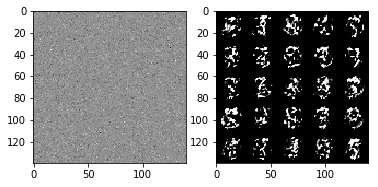

dis_loss: 0.15073174, en_loss: 2.91824484, temp_en_loss_dis: 2.91824484, recon_loss: -0.4979
dis_loss: 1.47790504, en_loss: 0.30333906, temp_en_loss_dis: 0.30333906, recon_loss: -0.5004
dis_loss: 0.11908725, en_loss: 3.53934383, temp_en_loss_dis: 3.53934383, recon_loss: -0.4898
dis_loss: 0.47072834, en_loss: 1.20496368, temp_en_loss_dis: 1.20496368, recon_loss: -0.4985
dis_loss: 1.65161920, en_loss: 0.24363881, temp_en_loss_dis: 0.24363881, recon_loss: -0.4922
dis_loss: 0.15875822, en_loss: 2.77863979, temp_en_loss_dis: 2.77863979, recon_loss: -0.5079
dis_loss: 1.75266635, en_loss: 0.22311713, temp_en_loss_dis: 0.22311713, recon_loss: -0.4936
dis_loss: 0.12623906, en_loss: 3.35215211, temp_en_loss_dis: 3.35215211, recon_loss: -0.5039
dis_loss: 0.55594784, en_loss: 1.02389383, temp_en_loss_dis: 1.02389383, recon_loss: -0.4790
dis_loss: 1.89284146, en_loss: 0.18962803, temp_en_loss_dis: 0.18962803, recon_loss: -0.4952
######### what? the reconstruction mse is: 2.7480


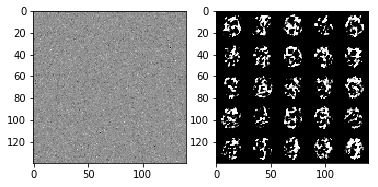

dis_loss: 0.14344582, en_loss: 2.97357249, temp_en_loss_dis: 2.97357249, recon_loss: -0.4989
dis_loss: 1.78416395, en_loss: 0.21071610, temp_en_loss_dis: 0.21071610, recon_loss: -0.4870
dis_loss: 0.12150696, en_loss: 3.34475517, temp_en_loss_dis: 3.34475517, recon_loss: -0.4824
dis_loss: 0.59118444, en_loss: 0.95981669, temp_en_loss_dis: 0.95981669, recon_loss: -0.4999
dis_loss: 1.88437915, en_loss: 0.18862623, temp_en_loss_dis: 0.18862623, recon_loss: -0.4756
dis_loss: 0.13683957, en_loss: 3.00833988, temp_en_loss_dis: 3.00833988, recon_loss: -0.4860
dis_loss: 1.42526114, en_loss: 0.32518393, temp_en_loss_dis: 0.32518393, recon_loss: -0.5019
dis_loss: 0.11362492, en_loss: 3.50522089, temp_en_loss_dis: 3.50522089, recon_loss: -0.5012
dis_loss: 0.51571846, en_loss: 1.10655940, temp_en_loss_dis: 1.10655940, recon_loss: -0.4932
dis_loss: 1.87223136, en_loss: 0.19986027, temp_en_loss_dis: 0.19986027, recon_loss: -0.5143
######### what? the reconstruction mse is: 2.7534


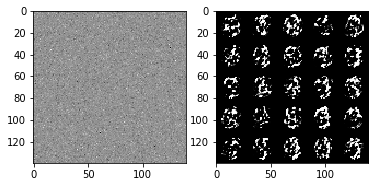

dis_loss: 0.13695753, en_loss: 3.06225419, temp_en_loss_dis: 3.06225419, recon_loss: -0.4874
dis_loss: 2.04139996, en_loss: 0.16212520, temp_en_loss_dis: 0.16212520, recon_loss: -0.5181
dis_loss: 0.10892340, en_loss: 3.66399384, temp_en_loss_dis: 3.66399384, recon_loss: -0.4917
dis_loss: 0.46658507, en_loss: 1.18644035, temp_en_loss_dis: 1.18644035, recon_loss: -0.5217
dis_loss: 1.55374599, en_loss: 0.27192003, temp_en_loss_dis: 0.27192003, recon_loss: -0.5026
dis_loss: 0.11706086, en_loss: 3.35936975, temp_en_loss_dis: 3.35936975, recon_loss: -0.4891
dis_loss: 1.35541010, en_loss: 0.34792072, temp_en_loss_dis: 0.34792072, recon_loss: -0.5147
dis_loss: 0.11148972, en_loss: 3.60875416, temp_en_loss_dis: 3.60875416, recon_loss: -0.4988
dis_loss: 0.40987366, en_loss: 1.33418250, temp_en_loss_dis: 1.33418250, recon_loss: -0.4765
dis_loss: 1.52417707, en_loss: 0.28236514, temp_en_loss_dis: 0.28236514, recon_loss: -0.4824
######### what? the reconstruction mse is: 2.7336


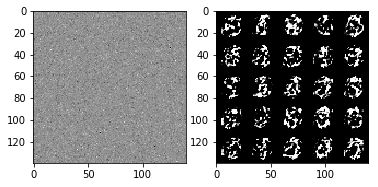

dis_loss: 0.12938154, en_loss: 3.04523611, temp_en_loss_dis: 3.04523611, recon_loss: -0.4831
dis_loss: 2.02260184, en_loss: 0.16518867, temp_en_loss_dis: 0.16518867, recon_loss: -0.4946
dis_loss: 0.10964347, en_loss: 3.52723980, temp_en_loss_dis: 3.52723980, recon_loss: -0.5147
dis_loss: 0.77510428, en_loss: 0.72878599, temp_en_loss_dis: 0.72878599, recon_loss: -0.4892
dis_loss: 0.09428206, en_loss: 3.96592236, temp_en_loss_dis: 3.96592236, recon_loss: -0.5034
dis_loss: 0.32987756, en_loss: 1.60467923, temp_en_loss_dis: 1.60467923, recon_loss: -0.5233
dis_loss: 1.50126743, en_loss: 0.28445250, temp_en_loss_dis: 0.28445250, recon_loss: -0.5164
dis_loss: 0.11498709, en_loss: 3.27889109, temp_en_loss_dis: 3.27889109, recon_loss: -0.4971
dis_loss: 1.70096564, en_loss: 0.22736570, temp_en_loss_dis: 0.22736570, recon_loss: -0.4889
dis_loss: 0.09304271, en_loss: 3.91955566, temp_en_loss_dis: 3.91955566, recon_loss: -0.4754
######### what? the reconstruction mse is: 2.7552


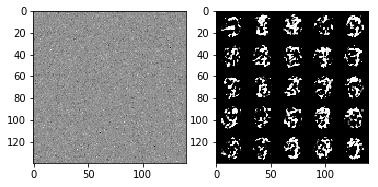

dis_loss: 0.63524485, en_loss: 0.87732786, temp_en_loss_dis: 0.87732786, recon_loss: -0.5116
dis_loss: 2.21013260, en_loss: 0.12954918, temp_en_loss_dis: 0.12954918, recon_loss: -0.5088
dis_loss: 0.12162828, en_loss: 3.09280634, temp_en_loss_dis: 3.09280634, recon_loss: -0.5055
dis_loss: 2.03735733, en_loss: 0.16039720, temp_en_loss_dis: 0.16039720, recon_loss: -0.5018
dis_loss: 0.09275626, en_loss: 3.93551540, temp_en_loss_dis: 3.93551540, recon_loss: -0.5099
dis_loss: 0.54984361, en_loss: 1.00640917, temp_en_loss_dis: 1.00640917, recon_loss: -0.4916
dis_loss: 2.11416674, en_loss: 0.14498299, temp_en_loss_dis: 0.14498299, recon_loss: -0.5081
dis_loss: 0.10963993, en_loss: 3.33379292, temp_en_loss_dis: 3.33379292, recon_loss: -0.5109
dis_loss: 1.31004882, en_loss: 0.36479044, temp_en_loss_dis: 0.36479044, recon_loss: -0.4970
dis_loss: 0.09195690, en_loss: 3.87515974, temp_en_loss_dis: 3.87515974, recon_loss: -0.4991
######### what? the reconstruction mse is: 2.7516


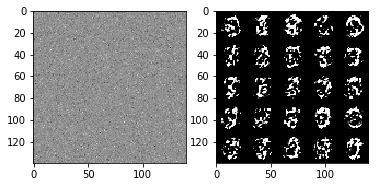

dis_loss: 0.56420875, en_loss: 1.01139474, temp_en_loss_dis: 1.01139474, recon_loss: -0.4953
dis_loss: 1.83269501, en_loss: 0.19604804, temp_en_loss_dis: 0.19604804, recon_loss: -0.4839
dis_loss: 0.11134166, en_loss: 3.35162020, temp_en_loss_dis: 3.35162020, recon_loss: -0.5001
dis_loss: 1.56451321, en_loss: 0.27257466, temp_en_loss_dis: 0.27257466, recon_loss: -0.4662
dis_loss: 0.09183043, en_loss: 3.94219542, temp_en_loss_dis: 3.94219542, recon_loss: -0.4968
dis_loss: 0.44306749, en_loss: 1.18668199, temp_en_loss_dis: 1.18668199, recon_loss: -0.5076
dis_loss: 1.64359391, en_loss: 0.24787894, temp_en_loss_dis: 0.24787894, recon_loss: -0.5031
dis_loss: 0.11661667, en_loss: 3.13344669, temp_en_loss_dis: 3.13344669, recon_loss: -0.5051
dis_loss: 1.97382176, en_loss: 0.16942564, temp_en_loss_dis: 0.16942564, recon_loss: -0.4865
dis_loss: 0.09046151, en_loss: 3.98512149, temp_en_loss_dis: 3.98512149, recon_loss: -0.5041
######### what? the reconstruction mse is: 2.7380


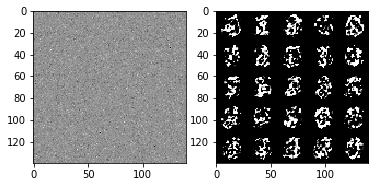

dis_loss: 0.82234591, en_loss: 0.65426266, temp_en_loss_dis: 0.65426266, recon_loss: -0.5052
dis_loss: 0.08799562, en_loss: 4.09669685, temp_en_loss_dis: 4.09669685, recon_loss: -0.4775
dis_loss: 0.49074909, en_loss: 1.09822392, temp_en_loss_dis: 1.09822392, recon_loss: -0.5239
dis_loss: 1.92685461, en_loss: 0.17862859, temp_en_loss_dis: 0.17862859, recon_loss: -0.4968
dis_loss: 0.10147256, en_loss: 3.41218257, temp_en_loss_dis: 3.41218257, recon_loss: -0.5049
dis_loss: 1.84550667, en_loss: 0.19213568, temp_en_loss_dis: 0.19213568, recon_loss: -0.5229
dis_loss: 0.09014685, en_loss: 3.83360147, temp_en_loss_dis: 3.83360147, recon_loss: -0.4855
dis_loss: 0.71423036, en_loss: 0.76446152, temp_en_loss_dis: 0.76446152, recon_loss: -0.4924
dis_loss: 2.34533978, en_loss: 0.11438181, temp_en_loss_dis: 0.11438181, recon_loss: -0.4992
dis_loss: 0.11633448, en_loss: 3.16346478, temp_en_loss_dis: 3.16346478, recon_loss: -0.4933
######### what? the reconstruction mse is: 2.7837


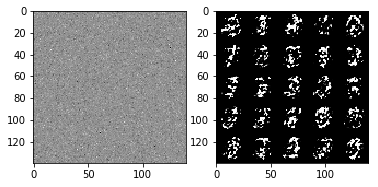

dis_loss: 2.30214214, en_loss: 0.11974186, temp_en_loss_dis: 0.11974186, recon_loss: -0.5166
dis_loss: 0.09332055, en_loss: 3.80029917, temp_en_loss_dis: 3.80029917, recon_loss: -0.4937
dis_loss: 0.82305908, en_loss: 0.65009528, temp_en_loss_dis: 0.65009528, recon_loss: -0.5198
dis_loss: 0.08102260, en_loss: 4.33770180, temp_en_loss_dis: 4.33770180, recon_loss: -0.5007
dis_loss: 0.23029663, en_loss: 1.93792367, temp_en_loss_dis: 1.93792367, recon_loss: -0.5159
dis_loss: 1.01226306, en_loss: 0.50721741, temp_en_loss_dis: 0.50721741, recon_loss: -0.4996
dis_loss: 0.10150348, en_loss: 3.48762846, temp_en_loss_dis: 3.48762846, recon_loss: -0.5010
dis_loss: 1.60434151, en_loss: 0.25630414, temp_en_loss_dis: 0.25630414, recon_loss: -0.4997
dis_loss: 0.09038980, en_loss: 3.80586958, temp_en_loss_dis: 3.80586958, recon_loss: -0.5000
dis_loss: 1.28126371, en_loss: 0.36350459, temp_en_loss_dis: 0.36350459, recon_loss: -0.4816
######### what? the reconstruction mse is: 2.7533


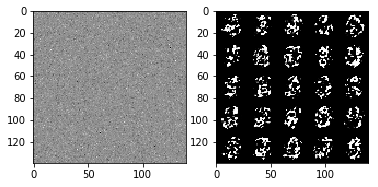

dis_loss: 0.08240819, en_loss: 4.15126514, temp_en_loss_dis: 4.15126514, recon_loss: -0.4997
dis_loss: 0.63396358, en_loss: 0.86082029, temp_en_loss_dis: 0.86082029, recon_loss: -0.4651
dis_loss: 2.58434224, en_loss: 0.08767548, temp_en_loss_dis: 0.08767548, recon_loss: -0.4961
dis_loss: 0.10256736, en_loss: 3.37156320, temp_en_loss_dis: 3.37156320, recon_loss: -0.4772
dis_loss: 2.03675723, en_loss: 0.15872911, temp_en_loss_dis: 0.15872911, recon_loss: -0.4894
dis_loss: 0.08337408, en_loss: 4.14738464, temp_en_loss_dis: 4.14738464, recon_loss: -0.4852
dis_loss: 0.57033014, en_loss: 0.94357383, temp_en_loss_dis: 0.94357383, recon_loss: -0.4857
dis_loss: 2.28267574, en_loss: 0.12013333, temp_en_loss_dis: 0.12013333, recon_loss: -0.4832
dis_loss: 0.09516247, en_loss: 3.63350582, temp_en_loss_dis: 3.63350582, recon_loss: -0.4976
dis_loss: 2.28625798, en_loss: 0.12215556, temp_en_loss_dis: 0.12215556, recon_loss: -0.5206
######### what? the reconstruction mse is: 2.7625


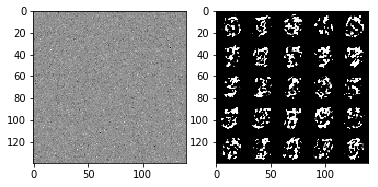

dis_loss: 0.08344395, en_loss: 4.32435656, temp_en_loss_dis: 4.32435656, recon_loss: -0.5129
dis_loss: 0.68760705, en_loss: 0.79576635, temp_en_loss_dis: 0.79576635, recon_loss: -0.4697
dis_loss: 2.71972013, en_loss: 0.07574694, temp_en_loss_dis: 0.07574694, recon_loss: -0.5207
dis_loss: 0.09955319, en_loss: 3.45078015, temp_en_loss_dis: 3.45078015, recon_loss: -0.4659
dis_loss: 2.05448627, en_loss: 0.15700865, temp_en_loss_dis: 0.15700865, recon_loss: -0.4982
dis_loss: 0.08650723, en_loss: 4.06719255, temp_en_loss_dis: 4.06719255, recon_loss: -0.4999
dis_loss: 0.86435109, en_loss: 0.61426258, temp_en_loss_dis: 0.61426258, recon_loss: -0.4850
dis_loss: 0.07599284, en_loss: 4.52307415, temp_en_loss_dis: 4.52307415, recon_loss: -0.5033
dis_loss: 0.24042431, en_loss: 1.88635635, temp_en_loss_dis: 1.88635635, recon_loss: -0.5144
dis_loss: 1.37100482, en_loss: 0.32635367, temp_en_loss_dis: 0.32635367, recon_loss: -0.4803
######### what? the reconstruction mse is: 2.7626


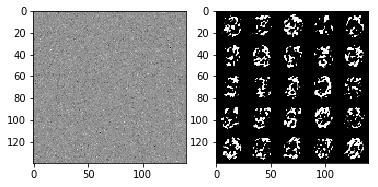

dis_loss: 0.09063923, en_loss: 3.77310181, temp_en_loss_dis: 3.77310181, recon_loss: -0.4980
dis_loss: 1.60526574, en_loss: 0.25669503, temp_en_loss_dis: 0.25669503, recon_loss: -0.4806
dis_loss: 0.08060965, en_loss: 4.24728298, temp_en_loss_dis: 4.24728298, recon_loss: -0.5002
dis_loss: 1.00318134, en_loss: 0.50740409, temp_en_loss_dis: 0.50740409, recon_loss: -0.5043
dis_loss: 0.07922530, en_loss: 4.28610516, temp_en_loss_dis: 4.28610516, recon_loss: -0.5052
dis_loss: 0.85183609, en_loss: 0.63363051, temp_en_loss_dis: 0.63363051, recon_loss: -0.4863
dis_loss: 0.07460301, en_loss: 4.42330551, temp_en_loss_dis: 4.42330551, recon_loss: -0.4791
dis_loss: 0.63745856, en_loss: 0.86055118, temp_en_loss_dis: 0.86055118, recon_loss: -0.4770
dis_loss: 2.71530652, en_loss: 0.07623637, temp_en_loss_dis: 0.07623637, recon_loss: -0.4806
dis_loss: 0.09751997, en_loss: 3.47824287, temp_en_loss_dis: 3.47824287, recon_loss: -0.5151
######### what? the reconstruction mse is: 2.7279


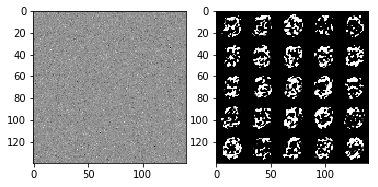

dis_loss: 2.37631750, en_loss: 0.10900053, temp_en_loss_dis: 0.10900053, recon_loss: -0.5044
dis_loss: 0.08213842, en_loss: 4.15813923, temp_en_loss_dis: 4.15813923, recon_loss: -0.4823
dis_loss: 1.97548473, en_loss: 0.16705818, temp_en_loss_dis: 0.16705818, recon_loss: -0.5073
dis_loss: 0.08287269, en_loss: 4.16093111, temp_en_loss_dis: 4.16093111, recon_loss: -0.5025
dis_loss: 0.95050877, en_loss: 0.54871047, temp_en_loss_dis: 0.54871047, recon_loss: -0.4991
dis_loss: 0.07486928, en_loss: 4.54479504, temp_en_loss_dis: 4.54479504, recon_loss: -0.5216
dis_loss: 0.28097159, en_loss: 1.69904947, temp_en_loss_dis: 1.69904947, recon_loss: -0.5003
dis_loss: 1.52352214, en_loss: 0.27495569, temp_en_loss_dis: 0.27495569, recon_loss: -0.5058
dis_loss: 0.08313124, en_loss: 4.06181431, temp_en_loss_dis: 4.06181431, recon_loss: -0.5047
dis_loss: 1.79694951, en_loss: 0.19966805, temp_en_loss_dis: 0.19966805, recon_loss: -0.5132
######### what? the reconstruction mse is: 2.7518


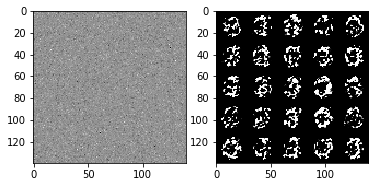

dis_loss: 0.07629276, en_loss: 4.37714863, temp_en_loss_dis: 4.37714863, recon_loss: -0.4740
dis_loss: 1.01065207, en_loss: 0.50808012, temp_en_loss_dis: 0.50808012, recon_loss: -0.5007
dis_loss: 0.07305203, en_loss: 4.63216019, temp_en_loss_dis: 4.63216019, recon_loss: -0.5231
dis_loss: 0.86583114, en_loss: 0.61143279, temp_en_loss_dis: 0.61143279, recon_loss: -0.4931
dis_loss: 0.07585564, en_loss: 4.35782814, temp_en_loss_dis: 4.35782814, recon_loss: -0.5180
dis_loss: 0.94666392, en_loss: 0.54571253, temp_en_loss_dis: 0.54571253, recon_loss: -0.5052
dis_loss: 0.07752714, en_loss: 4.27939796, temp_en_loss_dis: 4.27939796, recon_loss: -0.5203
dis_loss: 1.13225543, en_loss: 0.43939114, temp_en_loss_dis: 0.43939114, recon_loss: -0.4792
dis_loss: 0.07416724, en_loss: 4.30916691, temp_en_loss_dis: 4.30916691, recon_loss: -0.4836
dis_loss: 0.89324188, en_loss: 0.59009171, temp_en_loss_dis: 0.59009171, recon_loss: -0.5015
######### what? the reconstruction mse is: 2.7246


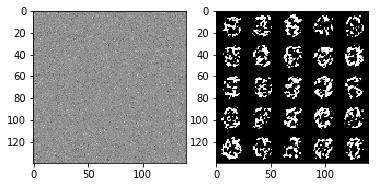

dis_loss: 0.06993176, en_loss: 4.59365606, temp_en_loss_dis: 4.59365606, recon_loss: -0.4864
dis_loss: 0.72356623, en_loss: 0.74931031, temp_en_loss_dis: 0.74931031, recon_loss: -0.4930
dis_loss: 0.06876127, en_loss: 4.72201443, temp_en_loss_dis: 4.72201443, recon_loss: -0.4980
dis_loss: 0.63335258, en_loss: 0.85290730, temp_en_loss_dis: 0.85290730, recon_loss: -0.4831
dis_loss: 2.84955692, en_loss: 0.06767702, temp_en_loss_dis: 0.06767702, recon_loss: -0.5018
dis_loss: 0.07683901, en_loss: 4.18090343, temp_en_loss_dis: 4.18090343, recon_loss: -0.4647
dis_loss: 2.46659732, en_loss: 0.10180016, temp_en_loss_dis: 0.10180016, recon_loss: -0.4954
dis_loss: 0.07765618, en_loss: 4.12702084, temp_en_loss_dis: 4.12702084, recon_loss: -0.4884
dis_loss: 1.94073284, en_loss: 0.17396833, temp_en_loss_dis: 0.17396833, recon_loss: -0.4860
dis_loss: 0.07090674, en_loss: 4.49741697, temp_en_loss_dis: 4.49741697, recon_loss: -0.4988
######### what? the reconstruction mse is: 2.7388


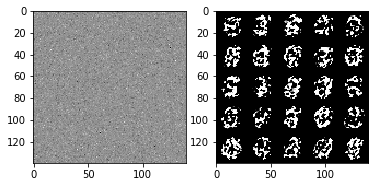

dis_loss: 1.71562994, en_loss: 0.21896103, temp_en_loss_dis: 0.21896103, recon_loss: -0.4923
dis_loss: 0.07554174, en_loss: 4.32785511, temp_en_loss_dis: 4.32785511, recon_loss: -0.4880
dis_loss: 1.32151854, en_loss: 0.34447956, temp_en_loss_dis: 0.34447956, recon_loss: -0.5052
dis_loss: 0.07460191, en_loss: 4.47284126, temp_en_loss_dis: 4.47284126, recon_loss: -0.4932
dis_loss: 1.31620193, en_loss: 0.34639555, temp_en_loss_dis: 0.34639555, recon_loss: -0.4944
dis_loss: 0.07334256, en_loss: 4.44352102, temp_en_loss_dis: 4.44352102, recon_loss: -0.4975
dis_loss: 1.16480601, en_loss: 0.41958869, temp_en_loss_dis: 0.41958869, recon_loss: -0.4888
dis_loss: 0.07784856, en_loss: 4.02809334, temp_en_loss_dis: 4.02809334, recon_loss: -0.5187
dis_loss: 1.53452694, en_loss: 0.27233800, temp_en_loss_dis: 0.27233800, recon_loss: -0.4928
dis_loss: 0.07639588, en_loss: 4.30584908, temp_en_loss_dis: 4.30584908, recon_loss: -0.5028
######### what? the reconstruction mse is: 2.7527


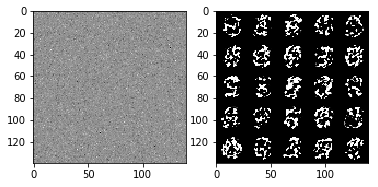

dis_loss: 1.64565659, en_loss: 0.23987567, temp_en_loss_dis: 0.23987567, recon_loss: -0.4928
dis_loss: 0.06988680, en_loss: 4.47004509, temp_en_loss_dis: 4.47004509, recon_loss: -0.4735
dis_loss: 1.51969624, en_loss: 0.27329275, temp_en_loss_dis: 0.27329275, recon_loss: -0.4966
dis_loss: 0.07050550, en_loss: 4.65589619, temp_en_loss_dis: 4.65589619, recon_loss: -0.5140
dis_loss: 0.72133255, en_loss: 0.74800140, temp_en_loss_dis: 0.74800140, recon_loss: -0.4945
dis_loss: 0.06487397, en_loss: 5.07550716, temp_en_loss_dis: 5.07550716, recon_loss: -0.4888
dis_loss: 0.32446331, en_loss: 1.49643731, temp_en_loss_dis: 1.49643731, recon_loss: -0.4959
dis_loss: 2.31009603, en_loss: 0.11730665, temp_en_loss_dis: 0.11730665, recon_loss: -0.4851
dis_loss: 0.07765875, en_loss: 4.21499634, temp_en_loss_dis: 4.21499634, recon_loss: -0.4796
dis_loss: 2.47180033, en_loss: 0.09819756, temp_en_loss_dis: 0.09819756, recon_loss: -0.4987
######### what? the reconstruction mse is: 2.7479


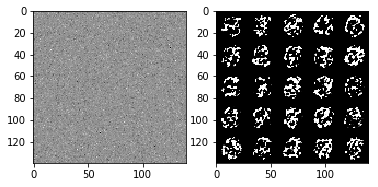

dis_loss: 0.07183099, en_loss: 4.29044628, temp_en_loss_dis: 4.29044628, recon_loss: -0.5266
dis_loss: 1.82264733, en_loss: 0.19791260, temp_en_loss_dis: 0.19791260, recon_loss: -0.5030
dis_loss: 0.07061606, en_loss: 4.57238007, temp_en_loss_dis: 4.57238007, recon_loss: -0.5284
dis_loss: 2.18393731, en_loss: 0.13048276, temp_en_loss_dis: 0.13048276, recon_loss: -0.5121
dis_loss: 0.07525297, en_loss: 4.30252743, temp_en_loss_dis: 4.30252743, recon_loss: -0.5107
dis_loss: 2.10293961, en_loss: 0.14740095, temp_en_loss_dis: 0.14740095, recon_loss: -0.5113
dis_loss: 0.07675488, en_loss: 4.39081240, temp_en_loss_dis: 4.39081240, recon_loss: -0.5077
dis_loss: 1.94554639, en_loss: 0.16947791, temp_en_loss_dis: 0.16947791, recon_loss: -0.4966
dis_loss: 0.07464896, en_loss: 4.37752151, temp_en_loss_dis: 4.37752151, recon_loss: -0.5086
dis_loss: 1.54015255, en_loss: 0.26875687, temp_en_loss_dis: 0.26875687, recon_loss: -0.5038
######### what? the reconstruction mse is: 2.7390


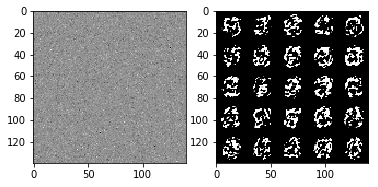

dis_loss: 0.07338594, en_loss: 4.38571835, temp_en_loss_dis: 4.38571835, recon_loss: -0.4865
dis_loss: 2.19631457, en_loss: 0.13256821, temp_en_loss_dis: 0.13256821, recon_loss: -0.4918
dis_loss: 0.07006109, en_loss: 4.71261215, temp_en_loss_dis: 4.71261215, recon_loss: -0.4786
dis_loss: 1.63341260, en_loss: 0.24017313, temp_en_loss_dis: 0.24017313, recon_loss: -0.4841
dis_loss: 0.07458651, en_loss: 4.56770515, temp_en_loss_dis: 4.56770515, recon_loss: -0.4852
dis_loss: 1.50087941, en_loss: 0.28118759, temp_en_loss_dis: 0.28118759, recon_loss: -0.4912
dis_loss: 0.07078376, en_loss: 4.67213249, temp_en_loss_dis: 4.67213249, recon_loss: -0.4896
dis_loss: 1.57426214, en_loss: 0.25784630, temp_en_loss_dis: 0.25784630, recon_loss: -0.4957
dis_loss: 0.07392858, en_loss: 4.40184069, temp_en_loss_dis: 4.40184069, recon_loss: -0.4995
dis_loss: 1.90698421, en_loss: 0.18034221, temp_en_loss_dis: 0.18034221, recon_loss: -0.5294
######### what? the reconstruction mse is: 2.7432


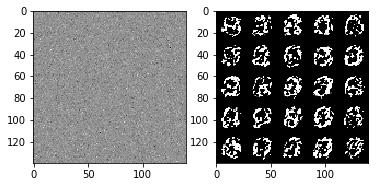

dis_loss: 0.07370310, en_loss: 4.51668978, temp_en_loss_dis: 4.51668978, recon_loss: -0.4976
dis_loss: 1.75244308, en_loss: 0.21423183, temp_en_loss_dis: 0.21423183, recon_loss: -0.4670
dis_loss: 0.07234465, en_loss: 4.59006119, temp_en_loss_dis: 4.59006119, recon_loss: -0.5197
dis_loss: 2.27089691, en_loss: 0.12423714, temp_en_loss_dis: 0.12423714, recon_loss: -0.4772
dis_loss: 0.07387376, en_loss: 4.45601702, temp_en_loss_dis: 4.45601702, recon_loss: -0.5122
dis_loss: 2.25647163, en_loss: 0.12749016, temp_en_loss_dis: 0.12749016, recon_loss: -0.4912
dis_loss: 0.07616413, en_loss: 4.57170582, temp_en_loss_dis: 4.57170582, recon_loss: -0.4973
dis_loss: 1.94440603, en_loss: 0.17185910, temp_en_loss_dis: 0.17185910, recon_loss: -0.4868
dis_loss: 0.07382284, en_loss: 4.59677076, temp_en_loss_dis: 4.59677076, recon_loss: -0.5022
dis_loss: 2.03009129, en_loss: 0.15713447, temp_en_loss_dis: 0.15713447, recon_loss: -0.4953
######### what? the reconstruction mse is: 2.7554


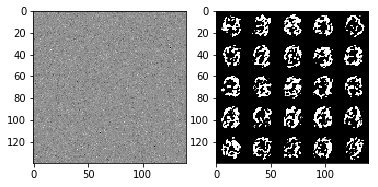

dis_loss: 0.07544415, en_loss: 4.42785358, temp_en_loss_dis: 4.42785358, recon_loss: -0.5005
dis_loss: 2.19742131, en_loss: 0.13119510, temp_en_loss_dis: 0.13119510, recon_loss: -0.5110
dis_loss: 0.07327672, en_loss: 4.61219215, temp_en_loss_dis: 4.61219215, recon_loss: -0.4957
dis_loss: 2.12114644, en_loss: 0.14416534, temp_en_loss_dis: 0.14416534, recon_loss: -0.4836
dis_loss: 0.07575677, en_loss: 4.55240822, temp_en_loss_dis: 4.55240822, recon_loss: -0.4918
dis_loss: 1.95875573, en_loss: 0.17456883, temp_en_loss_dis: 0.17456883, recon_loss: -0.4976
dis_loss: 0.07549474, en_loss: 4.47893286, temp_en_loss_dis: 4.47893286, recon_loss: -0.5108
dis_loss: 2.65982914, en_loss: 0.08329812, temp_en_loss_dis: 0.08329812, recon_loss: -0.5261
dis_loss: 0.08428597, en_loss: 4.31872654, temp_en_loss_dis: 4.31872654, recon_loss: -0.4932
dis_loss: 2.35474348, en_loss: 0.11096420, temp_en_loss_dis: 0.11096420, recon_loss: -0.5026
######### what? the reconstruction mse is: 2.7238


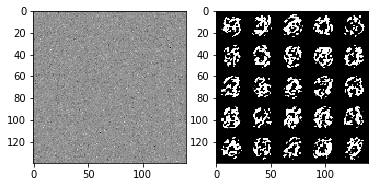

dis_loss: 0.07501599, en_loss: 4.53365517, temp_en_loss_dis: 4.53365517, recon_loss: -0.4783
dis_loss: 2.33758950, en_loss: 0.11637773, temp_en_loss_dis: 0.11637773, recon_loss: -0.5029
dis_loss: 0.08001472, en_loss: 4.59489202, temp_en_loss_dis: 4.59489202, recon_loss: -0.5024
dis_loss: 2.34089255, en_loss: 0.11774038, temp_en_loss_dis: 0.11774038, recon_loss: -0.5023
dis_loss: 0.07313173, en_loss: 4.83798599, temp_en_loss_dis: 4.83798599, recon_loss: -0.4934
dis_loss: 2.10853744, en_loss: 0.14835462, temp_en_loss_dis: 0.14835462, recon_loss: -0.5035
dis_loss: 0.07572246, en_loss: 4.60330343, temp_en_loss_dis: 4.60330343, recon_loss: -0.5003
dis_loss: 1.92604041, en_loss: 0.18157107, temp_en_loss_dis: 0.18157107, recon_loss: -0.5101
dis_loss: 0.07736897, en_loss: 4.60408401, temp_en_loss_dis: 4.60408401, recon_loss: -0.4932
dis_loss: 2.31399298, en_loss: 0.11999661, temp_en_loss_dis: 0.11999661, recon_loss: -0.4971
######### what? the reconstruction mse is: 2.7427


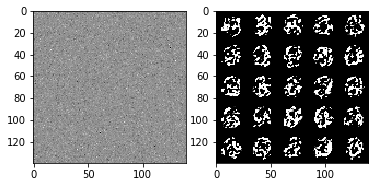

dis_loss: 0.08128203, en_loss: 4.39919901, temp_en_loss_dis: 4.39919901, recon_loss: -0.5179
dis_loss: 2.27230501, en_loss: 0.12469164, temp_en_loss_dis: 0.12469164, recon_loss: -0.4931
dis_loss: 0.07724376, en_loss: 4.53794956, temp_en_loss_dis: 4.53794956, recon_loss: -0.4897
dis_loss: 2.09848976, en_loss: 0.14814071, temp_en_loss_dis: 0.14814071, recon_loss: -0.5108
dis_loss: 0.07349636, en_loss: 4.75956821, temp_en_loss_dis: 4.75956821, recon_loss: -0.5196
dis_loss: 1.37062073, en_loss: 0.33031002, temp_en_loss_dis: 0.33031002, recon_loss: -0.4848
dis_loss: 0.07303536, en_loss: 4.83394337, temp_en_loss_dis: 4.83394337, recon_loss: -0.4972
dis_loss: 1.21680820, en_loss: 0.39703447, temp_en_loss_dis: 0.39703447, recon_loss: -0.4682
dis_loss: 0.07648155, en_loss: 4.82667875, temp_en_loss_dis: 4.82667875, recon_loss: -0.4790
dis_loss: 2.35511041, en_loss: 0.11255129, temp_en_loss_dis: 0.11255129, recon_loss: -0.4958
######### what? the reconstruction mse is: 2.7495


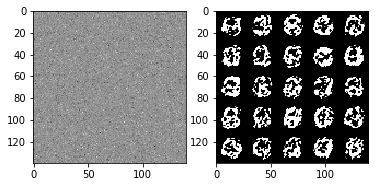

dis_loss: 0.07706555, en_loss: 4.38836622, temp_en_loss_dis: 4.38836622, recon_loss: -0.4887
dis_loss: 2.41973662, en_loss: 0.10466260, temp_en_loss_dis: 0.10466260, recon_loss: -0.4909
dis_loss: 0.07472757, en_loss: 4.63168716, temp_en_loss_dis: 4.63168716, recon_loss: -0.4964
dis_loss: 2.69394827, en_loss: 0.08180010, temp_en_loss_dis: 0.08180010, recon_loss: -0.4944
dis_loss: 0.07823204, en_loss: 4.56897163, temp_en_loss_dis: 4.56897163, recon_loss: -0.5090
dis_loss: 2.74569082, en_loss: 0.07621565, temp_en_loss_dis: 0.07621565, recon_loss: -0.4904
dis_loss: 0.07667742, en_loss: 4.91087437, temp_en_loss_dis: 4.91087437, recon_loss: -0.4981
dis_loss: 2.15143347, en_loss: 0.14394799, temp_en_loss_dis: 0.14394799, recon_loss: -0.4883
dis_loss: 0.08016595, en_loss: 4.28594208, temp_en_loss_dis: 4.28594208, recon_loss: -0.5026
dis_loss: 3.06144643, en_loss: 0.05567404, temp_en_loss_dis: 0.05567404, recon_loss: -0.5152
######### what? the reconstruction mse is: 2.7457


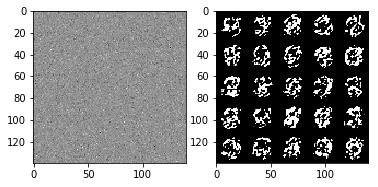

dis_loss: 0.07694717, en_loss: 4.70681572, temp_en_loss_dis: 4.70681572, recon_loss: -0.5235
dis_loss: 2.40998483, en_loss: 0.10371572, temp_en_loss_dis: 0.10371572, recon_loss: -0.5240
dis_loss: 0.07632628, en_loss: 4.64420795, temp_en_loss_dis: 4.64420795, recon_loss: -0.4947
dis_loss: 2.03542089, en_loss: 0.16162044, temp_en_loss_dis: 0.16162044, recon_loss: -0.5068
dis_loss: 0.08498561, en_loss: 4.31900692, temp_en_loss_dis: 4.31900692, recon_loss: -0.4930
dis_loss: 2.74291992, en_loss: 0.08021567, temp_en_loss_dis: 0.08021567, recon_loss: -0.4909
dis_loss: 0.07955039, en_loss: 4.60383463, temp_en_loss_dis: 4.60383463, recon_loss: -0.5129
dis_loss: 2.34103847, en_loss: 0.12173612, temp_en_loss_dis: 0.12173612, recon_loss: -0.4862
dis_loss: 0.07495078, en_loss: 4.72131681, temp_en_loss_dis: 4.72131681, recon_loss: -0.4999
dis_loss: 2.30211306, en_loss: 0.12792909, temp_en_loss_dis: 0.12792909, recon_loss: -0.4807
######### what? the reconstruction mse is: 2.7427


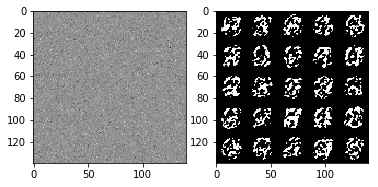

dis_loss: 0.08020625, en_loss: 4.54568386, temp_en_loss_dis: 4.54568386, recon_loss: -0.4721
dis_loss: 2.84444308, en_loss: 0.06696321, temp_en_loss_dis: 0.06696321, recon_loss: -0.4871
dis_loss: 0.08250901, en_loss: 4.32821751, temp_en_loss_dis: 4.32821751, recon_loss: -0.4917
dis_loss: 2.93410039, en_loss: 0.06407857, temp_en_loss_dis: 0.06407857, recon_loss: -0.5030
dis_loss: 0.08427921, en_loss: 4.29875231, temp_en_loss_dis: 4.29875231, recon_loss: -0.4934
dis_loss: 2.71968627, en_loss: 0.08296393, temp_en_loss_dis: 0.08296393, recon_loss: -0.5022
dis_loss: 0.08040069, en_loss: 4.58467150, temp_en_loss_dis: 4.58467150, recon_loss: -0.4829
dis_loss: 2.83787465, en_loss: 0.06965517, temp_en_loss_dis: 0.06965517, recon_loss: -0.5117
dis_loss: 0.08313067, en_loss: 4.46974468, temp_en_loss_dis: 4.46974468, recon_loss: -0.5279
dis_loss: 2.52123332, en_loss: 0.09911886, temp_en_loss_dis: 0.09911886, recon_loss: -0.4890
######### what? the reconstruction mse is: 2.7377


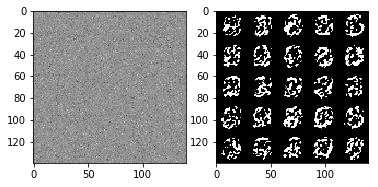

dis_loss: 0.08786370, en_loss: 4.20273590, temp_en_loss_dis: 4.20273590, recon_loss: -0.5174
dis_loss: 3.08169651, en_loss: 0.05445720, temp_en_loss_dis: 0.05445720, recon_loss: -0.5033
dis_loss: 0.08505044, en_loss: 4.36135006, temp_en_loss_dis: 4.36135006, recon_loss: -0.4018
dis_loss: 3.17950344, en_loss: 0.04797786, temp_en_loss_dis: 0.04797786, recon_loss: -0.4947


In [40]:
batch_size = 32
learning_rate = 0.0002
beta1 = 0.5
beta2 = 0.9
M = 1
z_dim = 1024
tf.reset_default_graph()
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2
sample_set = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg'))[:25])
sample_images = next(sample_set.get_batches(25))

sample_images = np.reshape(sample_from_dis(25, INPUT_DIM,dis = 'laplacian'), [25] + IMAGE_SHAPE)


mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg'))[25:])

print(mnist_dataset.shape)

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, beta2, M, mnist_dataset.get_batches, 
         sample_images, mnist_dataset.shape, mnist_dataset.image_mode)

## Faces

(202574, 28, 28, 3)
 [*] Reading checkpoints...
NOT found a model === Initializing a new one
dis_loss: 1.23848355, en_loss: 1.38965702, temp_en_loss_dis: 0.97782409, recon_loss: 0.4118
dis_loss: 1.18022919, en_loss: 1.20883143, temp_en_loss_dis: 0.93621576, recon_loss: 0.2726
dis_loss: 1.14616954, en_loss: 1.26338911, temp_en_loss_dis: 0.97009879, recon_loss: 0.2933
dis_loss: 1.05781889, en_loss: 1.27583623, temp_en_loss_dis: 1.03466058, recon_loss: 0.2412
dis_loss: 1.02001023, en_loss: 1.25602829, temp_en_loss_dis: 1.12507641, recon_loss: 0.1310
dis_loss: 0.92575181, en_loss: 1.37266028, temp_en_loss_dis: 1.19916058, recon_loss: 0.1735
dis_loss: 0.81229627, en_loss: 1.60093784, temp_en_loss_dis: 1.33980870, recon_loss: 0.2611
dis_loss: 0.74313855, en_loss: 1.62393498, temp_en_loss_dis: 1.47658730, recon_loss: 0.1473
dis_loss: 0.65591830, en_loss: 1.81416178, temp_en_loss_dis: 1.62054241, recon_loss: 0.1936
dis_loss: 0.66969430, en_loss: 1.93026352, temp_en_loss_dis: 1.76853907, recon_

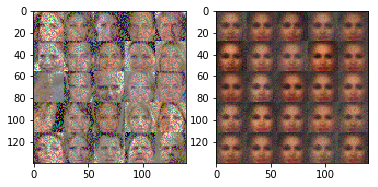

dis_loss: 0.57971156, en_loss: 2.12531161, temp_en_loss_dis: 1.90063560, recon_loss: 0.2247
dis_loss: 0.51297748, en_loss: 2.17403913, temp_en_loss_dis: 2.04125309, recon_loss: 0.1328
dis_loss: 0.49672434, en_loss: 2.48354340, temp_en_loss_dis: 2.22936249, recon_loss: 0.2542
dis_loss: 0.41452754, en_loss: 2.61644268, temp_en_loss_dis: 2.43022585, recon_loss: 0.1862
dis_loss: 0.43881643, en_loss: 2.70631289, temp_en_loss_dis: 2.51757669, recon_loss: 0.1887
dis_loss: 0.36169189, en_loss: 2.87796760, temp_en_loss_dis: 2.66627169, recon_loss: 0.2117
dis_loss: 0.38641816, en_loss: 2.87495685, temp_en_loss_dis: 2.70313311, recon_loss: 0.1718
dis_loss: 0.30518770, en_loss: 2.98727560, temp_en_loss_dis: 2.80933857, recon_loss: 0.1779
dis_loss: 0.28480250, en_loss: 3.08090448, temp_en_loss_dis: 2.88335180, recon_loss: 0.1976
dis_loss: 0.25596538, en_loss: 3.17653131, temp_en_loss_dis: 3.04865932, recon_loss: 0.1279
######### what? the reconstruction mse is: 0.0483


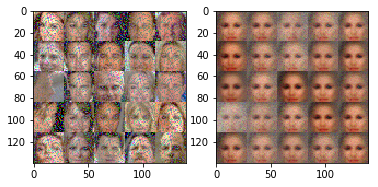

dis_loss: 0.21946800, en_loss: 3.30730057, temp_en_loss_dis: 3.14409518, recon_loss: 0.1632
dis_loss: 0.22022533, en_loss: 3.61886382, temp_en_loss_dis: 3.41720867, recon_loss: 0.2017
dis_loss: 0.18745224, en_loss: 3.57647705, temp_en_loss_dis: 3.43156099, recon_loss: 0.1449
dis_loss: 0.18149392, en_loss: 3.80414319, temp_en_loss_dis: 3.67645693, recon_loss: 0.1277
dis_loss: 0.16437022, en_loss: 3.94649768, temp_en_loss_dis: 3.67225718, recon_loss: 0.2742
dis_loss: 0.15177633, en_loss: 3.83264399, temp_en_loss_dis: 3.66404581, recon_loss: 0.1686
dis_loss: 0.13218623, en_loss: 3.98794532, temp_en_loss_dis: 3.82241344, recon_loss: 0.1655
dis_loss: 0.14655322, en_loss: 4.30290270, temp_en_loss_dis: 4.09144878, recon_loss: 0.2115
dis_loss: 0.11719348, en_loss: 4.31738901, temp_en_loss_dis: 4.13794231, recon_loss: 0.1794
dis_loss: 0.10329178, en_loss: 4.28923988, temp_en_loss_dis: 4.13538408, recon_loss: 0.1539
######### what? the reconstruction mse is: 0.0509


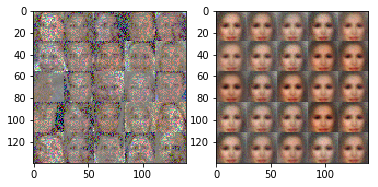

dis_loss: 0.09360661, en_loss: 4.52610922, temp_en_loss_dis: 4.35911179, recon_loss: 0.1670
dis_loss: 0.08760582, en_loss: 4.42320061, temp_en_loss_dis: 4.29835176, recon_loss: 0.1248
dis_loss: 0.07674890, en_loss: 4.65686703, temp_en_loss_dis: 4.54838705, recon_loss: 0.1085
dis_loss: 0.07267717, en_loss: 4.76627350, temp_en_loss_dis: 4.58967972, recon_loss: 0.1766
dis_loss: 0.06335035, en_loss: 5.01940203, temp_en_loss_dis: 4.84781933, recon_loss: 0.1716
dis_loss: 0.05619721, en_loss: 4.84624195, temp_en_loss_dis: 4.69237280, recon_loss: 0.1539
dis_loss: 0.05450035, en_loss: 5.15196323, temp_en_loss_dis: 4.92955351, recon_loss: 0.2224
dis_loss: 0.04693165, en_loss: 4.95962620, temp_en_loss_dis: 4.83140087, recon_loss: 0.1282
dis_loss: 0.05051175, en_loss: 5.12722111, temp_en_loss_dis: 4.93017006, recon_loss: 0.1971
dis_loss: 0.04417056, en_loss: 5.44626236, temp_en_loss_dis: 5.28443432, recon_loss: 0.1618
######### what? the reconstruction mse is: 0.0481


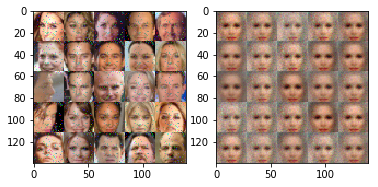

dis_loss: 0.04128800, en_loss: 5.54107809, temp_en_loss_dis: 5.36483908, recon_loss: 0.1762
dis_loss: 0.03870096, en_loss: 5.45058918, temp_en_loss_dis: 5.27280903, recon_loss: 0.1778
dis_loss: 0.03031015, en_loss: 5.72637415, temp_en_loss_dis: 5.54431343, recon_loss: 0.1821
dis_loss: 0.02738292, en_loss: 5.48827791, temp_en_loss_dis: 5.34550524, recon_loss: 0.1428
dis_loss: 0.02799030, en_loss: 5.95061970, temp_en_loss_dis: 5.79740572, recon_loss: 0.1532
dis_loss: 0.02222098, en_loss: 6.16340446, temp_en_loss_dis: 5.97809076, recon_loss: 0.1853
dis_loss: 0.01984136, en_loss: 6.14387512, temp_en_loss_dis: 6.01341724, recon_loss: 0.1305
dis_loss: 0.01919656, en_loss: 6.31957817, temp_en_loss_dis: 6.19447136, recon_loss: 0.1251
dis_loss: 0.02080420, en_loss: 6.03318214, temp_en_loss_dis: 5.79724789, recon_loss: 0.2359
dis_loss: 0.01458290, en_loss: 6.29247761, temp_en_loss_dis: 6.09816265, recon_loss: 0.1943
######### what? the reconstruction mse is: 0.0507


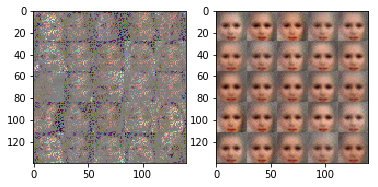

dis_loss: 0.01096238, en_loss: 6.95238113, temp_en_loss_dis: 6.75569105, recon_loss: 0.1967
dis_loss: 0.01424278, en_loss: 6.56722832, temp_en_loss_dis: 6.42923689, recon_loss: 0.1380
dis_loss: 0.01086324, en_loss: 6.59265852, temp_en_loss_dis: 6.39031839, recon_loss: 0.2023
dis_loss: 0.01056159, en_loss: 7.20712185, temp_en_loss_dis: 7.05897665, recon_loss: 0.1481
dis_loss: 0.00685752, en_loss: 7.10950470, temp_en_loss_dis: 6.92404175, recon_loss: 0.1855
dis_loss: 0.01541015, en_loss: 6.69376659, temp_en_loss_dis: 6.57962847, recon_loss: 0.1141
dis_loss: 0.00802735, en_loss: 7.17042065, temp_en_loss_dis: 6.97300673, recon_loss: 0.1974
dis_loss: 0.00670629, en_loss: 7.39153290, temp_en_loss_dis: 7.17477322, recon_loss: 0.2168
dis_loss: 0.00837460, en_loss: 7.15736008, temp_en_loss_dis: 6.99205351, recon_loss: 0.1653
dis_loss: 0.00496630, en_loss: 7.77510738, temp_en_loss_dis: 7.54575157, recon_loss: 0.2294
######### what? the reconstruction mse is: 0.0632


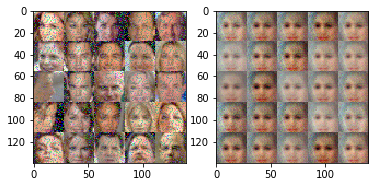

dis_loss: 0.00375235, en_loss: 8.07911110, temp_en_loss_dis: 7.84702826, recon_loss: 0.2321
dis_loss: 0.00443919, en_loss: 7.43478155, temp_en_loss_dis: 7.30751610, recon_loss: 0.1273
dis_loss: 0.00379856, en_loss: 8.13302040, temp_en_loss_dis: 7.90364838, recon_loss: 0.2294
dis_loss: 0.00269460, en_loss: 8.63112736, temp_en_loss_dis: 8.45896721, recon_loss: 0.1722
dis_loss: 0.00329137, en_loss: 7.92845011, temp_en_loss_dis: 7.77379227, recon_loss: 0.1547
dis_loss: 0.00496500, en_loss: 7.88052511, temp_en_loss_dis: 7.67081070, recon_loss: 0.2097
dis_loss: 0.00411048, en_loss: 7.77344322, temp_en_loss_dis: 7.61730051, recon_loss: 0.1561
dis_loss: 0.00653286, en_loss: 7.55390406, temp_en_loss_dis: 7.39246988, recon_loss: 0.1614
dis_loss: 0.00467749, en_loss: 8.43137646, temp_en_loss_dis: 8.21977806, recon_loss: 0.2116
dis_loss: 0.00237492, en_loss: 8.67987823, temp_en_loss_dis: 8.51075745, recon_loss: 0.1691
######### what? the reconstruction mse is: 0.0924


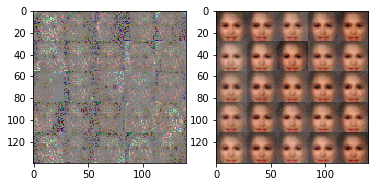

dis_loss: 0.00140253, en_loss: 9.14516354, temp_en_loss_dis: 8.99518299, recon_loss: 0.1500
dis_loss: 0.00133176, en_loss: 9.68247032, temp_en_loss_dis: 9.47840881, recon_loss: 0.2041
dis_loss: 0.00105036, en_loss: 9.78580761, temp_en_loss_dis: 9.71339989, recon_loss: 0.0724
dis_loss: 0.00090785, en_loss: 10.03290272, temp_en_loss_dis: 9.85212421, recon_loss: 0.1808
dis_loss: 0.00089967, en_loss: 9.25866985, temp_en_loss_dis: 9.03380299, recon_loss: 0.2249
dis_loss: 0.00238645, en_loss: 9.51527023, temp_en_loss_dis: 9.30558014, recon_loss: 0.2097
dis_loss: 0.00157532, en_loss: 9.13116932, temp_en_loss_dis: 8.94467258, recon_loss: 0.1865
dis_loss: 0.00128566, en_loss: 9.25505257, temp_en_loss_dis: 9.08623028, recon_loss: 0.1688
dis_loss: 0.00148080, en_loss: 9.14975929, temp_en_loss_dis: 8.97427273, recon_loss: 0.1755
dis_loss: 0.00104526, en_loss: 9.23153019, temp_en_loss_dis: 9.07505989, recon_loss: 0.1565
######### what? the reconstruction mse is: 0.1125


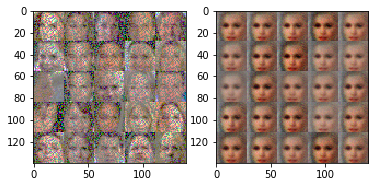

dis_loss: 0.00152670, en_loss: 10.20581627, temp_en_loss_dis: 10.02185154, recon_loss: 0.1840
dis_loss: 0.00171704, en_loss: 8.48258972, temp_en_loss_dis: 8.33912277, recon_loss: 0.1435
dis_loss: 0.00123982, en_loss: 9.98601437, temp_en_loss_dis: 9.78347015, recon_loss: 0.2025
dis_loss: 0.00091096, en_loss: 9.55801487, temp_en_loss_dis: 9.40394783, recon_loss: 0.1541
dis_loss: 0.00044675, en_loss: 10.55497742, temp_en_loss_dis: 10.41924572, recon_loss: 0.1357
dis_loss: 0.00037759, en_loss: 10.92295456, temp_en_loss_dis: 10.74639320, recon_loss: 0.1766
dis_loss: 0.00040387, en_loss: 10.41087341, temp_en_loss_dis: 10.20683479, recon_loss: 0.2040
dis_loss: 0.00026949, en_loss: 11.03493786, temp_en_loss_dis: 10.88044548, recon_loss: 0.1545
dis_loss: 0.00020320, en_loss: 11.17907047, temp_en_loss_dis: 10.99643230, recon_loss: 0.1826
dis_loss: 0.00021586, en_loss: 10.63857746, temp_en_loss_dis: 10.47075272, recon_loss: 0.1678
######### what? the reconstruction mse is: 0.0900


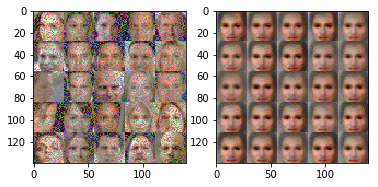

dis_loss: 0.00153696, en_loss: 7.68658876, temp_en_loss_dis: 7.53517294, recon_loss: 0.1514
dis_loss: 0.00055071, en_loss: 11.46407318, temp_en_loss_dis: 11.30983734, recon_loss: 0.1542
dis_loss: 0.00041465, en_loss: 11.08065128, temp_en_loss_dis: 10.90172958, recon_loss: 0.1789
dis_loss: 0.00023533, en_loss: 11.68226433, temp_en_loss_dis: 11.47822380, recon_loss: 0.2040
dis_loss: 0.00015282, en_loss: 11.95938492, temp_en_loss_dis: 11.80272293, recon_loss: 0.1567
dis_loss: 0.00013738, en_loss: 11.88308620, temp_en_loss_dis: 11.68574524, recon_loss: 0.1973
dis_loss: 0.00012716, en_loss: 11.40150356, temp_en_loss_dis: 11.30070496, recon_loss: 0.1008
dis_loss: 0.00016335, en_loss: 11.47039127, temp_en_loss_dis: 11.27713013, recon_loss: 0.1933
dis_loss: 0.00007076, en_loss: 12.03764153, temp_en_loss_dis: 11.91896629, recon_loss: 0.1187
dis_loss: 0.00006697, en_loss: 12.03227615, temp_en_loss_dis: 11.85769653, recon_loss: 0.1746
######### what? the reconstruction mse is: 0.0584


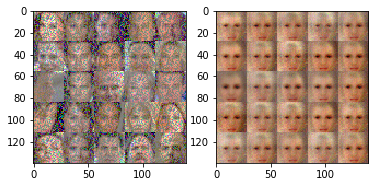

dis_loss: 0.00008518, en_loss: 11.90706730, temp_en_loss_dis: 11.76342392, recon_loss: 0.1436
dis_loss: 0.00038872, en_loss: 11.42796612, temp_en_loss_dis: 11.22607899, recon_loss: 0.2019
dis_loss: 0.00068962, en_loss: 10.22925758, temp_en_loss_dis: 10.05946445, recon_loss: 0.1698
dis_loss: 0.00048392, en_loss: 10.97866440, temp_en_loss_dis: 10.78470039, recon_loss: 0.1940
dis_loss: 0.00023768, en_loss: 11.93370628, temp_en_loss_dis: 11.77131653, recon_loss: 0.1624
dis_loss: 0.00013865, en_loss: 12.62989521, temp_en_loss_dis: 12.48486519, recon_loss: 0.1450
dis_loss: 0.00009800, en_loss: 13.39481163, temp_en_loss_dis: 13.25033188, recon_loss: 0.1445
dis_loss: 0.00020692, en_loss: 13.47463512, temp_en_loss_dis: 13.30742836, recon_loss: 0.1672
dis_loss: 0.00016273, en_loss: 11.62004471, temp_en_loss_dis: 11.45871162, recon_loss: 0.1613
dis_loss: 0.00012500, en_loss: 13.26239300, temp_en_loss_dis: 13.09106731, recon_loss: 0.1713
######### what? the reconstruction mse is: 0.1035


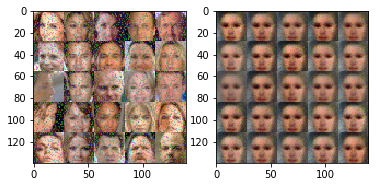

dis_loss: 0.00035311, en_loss: 10.97197247, temp_en_loss_dis: 10.75399971, recon_loss: 0.2180
dis_loss: 0.00077304, en_loss: 11.78458405, temp_en_loss_dis: 11.58047104, recon_loss: 0.2041
dis_loss: 0.00089832, en_loss: 11.96953773, temp_en_loss_dis: 11.82966042, recon_loss: 0.1399
dis_loss: 0.00014713, en_loss: 14.91171837, temp_en_loss_dis: 14.81387520, recon_loss: 0.0978
dis_loss: 0.00056504, en_loss: 14.56234646, temp_en_loss_dis: 14.38512707, recon_loss: 0.1772
dis_loss: 0.00018744, en_loss: 15.14546967, temp_en_loss_dis: 14.98878860, recon_loss: 0.1567
dis_loss: 0.00009890, en_loss: 15.87167931, temp_en_loss_dis: 15.72943211, recon_loss: 0.1422
dis_loss: 0.00015919, en_loss: 16.14841461, temp_en_loss_dis: 15.99366760, recon_loss: 0.1547
dis_loss: 0.00007973, en_loss: 16.47934151, temp_en_loss_dis: 16.36724472, recon_loss: 0.1121
dis_loss: 0.00008098, en_loss: 16.61585426, temp_en_loss_dis: 16.41765213, recon_loss: 0.1982
######### what? the reconstruction mse is: 0.1188


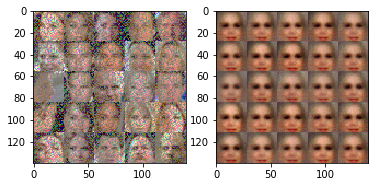

dis_loss: 0.00005538, en_loss: 14.80574512, temp_en_loss_dis: 14.69180775, recon_loss: 0.1139
dis_loss: 0.00045494, en_loss: 15.48612118, temp_en_loss_dis: 15.31334496, recon_loss: 0.1728
dis_loss: 0.00015560, en_loss: 11.42508984, temp_en_loss_dis: 11.28949356, recon_loss: 0.1356
dis_loss: 0.00015391, en_loss: 13.41570282, temp_en_loss_dis: 13.19513893, recon_loss: 0.2206
dis_loss: 0.00008290, en_loss: 14.68500042, temp_en_loss_dis: 14.53551388, recon_loss: 0.1495
dis_loss: 0.00006828, en_loss: 15.29836178, temp_en_loss_dis: 15.11940002, recon_loss: 0.1790
dis_loss: 0.00007494, en_loss: 15.94185066, temp_en_loss_dis: 15.75226593, recon_loss: 0.1896
dis_loss: 0.00003962, en_loss: 16.31433487, temp_en_loss_dis: 16.19505692, recon_loss: 0.1193
dis_loss: 0.00003230, en_loss: 16.84436417, temp_en_loss_dis: 16.65536690, recon_loss: 0.1890
dis_loss: 0.00002490, en_loss: 16.72496796, temp_en_loss_dis: 16.54534340, recon_loss: 0.1796
######### what? the reconstruction mse is: 0.0932


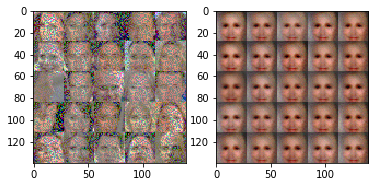

dis_loss: 0.00002797, en_loss: 16.72129250, temp_en_loss_dis: 16.50705528, recon_loss: 0.2142
dis_loss: 0.00001873, en_loss: 16.19839668, temp_en_loss_dis: 16.03623772, recon_loss: 0.1622
dis_loss: 0.00001387, en_loss: 15.42254448, temp_en_loss_dis: 15.23116207, recon_loss: 0.1914
dis_loss: 0.00001789, en_loss: 13.74313927, temp_en_loss_dis: 13.63415909, recon_loss: 0.1090
dis_loss: 0.00000962, en_loss: 14.82712364, temp_en_loss_dis: 14.70228863, recon_loss: 0.1248
dis_loss: 0.00001157, en_loss: 14.97945023, temp_en_loss_dis: 14.81949329, recon_loss: 0.1600
dis_loss: 0.00003742, en_loss: 14.29217339, temp_en_loss_dis: 14.14347744, recon_loss: 0.1487
dis_loss: 0.00010195, en_loss: 14.54296780, temp_en_loss_dis: 14.38438225, recon_loss: 0.1586
dis_loss: 0.00005604, en_loss: 16.20403862, temp_en_loss_dis: 16.09376526, recon_loss: 0.1103
dis_loss: 0.00015172, en_loss: 18.43192101, temp_en_loss_dis: 18.30065918, recon_loss: 0.1313
######### what? the reconstruction mse is: 0.3052


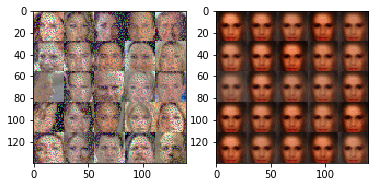

dis_loss: 0.00013136, en_loss: 16.53517151, temp_en_loss_dis: 16.32943726, recon_loss: 0.2057
dis_loss: 0.00008172, en_loss: 17.74076653, temp_en_loss_dis: 17.59860039, recon_loss: 0.1422
dis_loss: 0.00002927, en_loss: 18.21233940, temp_en_loss_dis: 18.04681396, recon_loss: 0.1655
dis_loss: 0.00003036, en_loss: 18.77086258, temp_en_loss_dis: 18.54956436, recon_loss: 0.2213
dis_loss: 0.00002466, en_loss: 19.21829796, temp_en_loss_dis: 19.02334976, recon_loss: 0.1949
dis_loss: 0.00001733, en_loss: 19.46739578, temp_en_loss_dis: 19.30731201, recon_loss: 0.1601
dis_loss: 0.00000759, en_loss: 18.77277565, temp_en_loss_dis: 18.59901047, recon_loss: 0.1738
dis_loss: 0.00001226, en_loss: 18.05058289, temp_en_loss_dis: 17.86474609, recon_loss: 0.1858
dis_loss: 0.00002491, en_loss: 16.46093941, temp_en_loss_dis: 16.33473015, recon_loss: 0.1262
dis_loss: 0.00001544, en_loss: 15.80811787, temp_en_loss_dis: 15.63543510, recon_loss: 0.1727
######### what? the reconstruction mse is: 0.1586


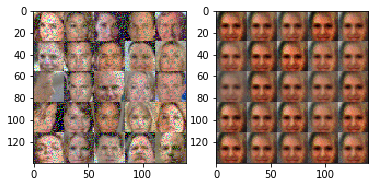

dis_loss: 0.00013050, en_loss: 17.03921700, temp_en_loss_dis: 16.86069489, recon_loss: 0.1785
dis_loss: 0.00001136, en_loss: 17.17383957, temp_en_loss_dis: 17.01108170, recon_loss: 0.1628
dis_loss: 0.00003276, en_loss: 17.50520706, temp_en_loss_dis: 17.30689812, recon_loss: 0.1983
dis_loss: 0.00029774, en_loss: 18.58639717, temp_en_loss_dis: 18.40488434, recon_loss: 0.1815
dis_loss: 0.00010673, en_loss: 16.39149666, temp_en_loss_dis: 16.28826904, recon_loss: 0.1032
dis_loss: 0.00008303, en_loss: 17.08541298, temp_en_loss_dis: 16.88958359, recon_loss: 0.1958
dis_loss: 0.00018308, en_loss: 17.00445557, temp_en_loss_dis: 16.82351875, recon_loss: 0.1809
dis_loss: 0.00022057, en_loss: 19.06416512, temp_en_loss_dis: 18.84641647, recon_loss: 0.2177
dis_loss: 0.00009601, en_loss: 19.21193886, temp_en_loss_dis: 19.00443268, recon_loss: 0.2075
dis_loss: 0.00026040, en_loss: 20.56900215, temp_en_loss_dis: 20.37982750, recon_loss: 0.1892
######### what? the reconstruction mse is: 0.0876


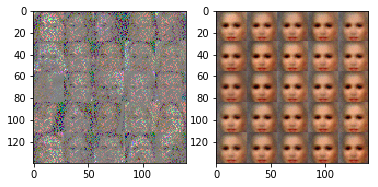

dis_loss: 0.00004914, en_loss: 19.84385300, temp_en_loss_dis: 19.66201782, recon_loss: 0.1818
dis_loss: 0.00003325, en_loss: 18.98236084, temp_en_loss_dis: 18.77280807, recon_loss: 0.2096
dis_loss: 0.00007718, en_loss: 19.86207008, temp_en_loss_dis: 19.69299507, recon_loss: 0.1691
dis_loss: 0.00003745, en_loss: 23.02840042, temp_en_loss_dis: 22.83206177, recon_loss: 0.1963
dis_loss: 0.00094092, en_loss: 23.21506500, temp_en_loss_dis: 23.06002808, recon_loss: 0.1550
dis_loss: 0.00000983, en_loss: 21.56941986, temp_en_loss_dis: 21.39894485, recon_loss: 0.1705
dis_loss: 0.00022822, en_loss: 22.46395874, temp_en_loss_dis: 22.27385139, recon_loss: 0.1901
dis_loss: 0.00010313, en_loss: 22.62735176, temp_en_loss_dis: 22.48170280, recon_loss: 0.1456
dis_loss: 0.00002314, en_loss: 22.97974396, temp_en_loss_dis: 22.83308983, recon_loss: 0.1467
dis_loss: 0.00001190, en_loss: 23.50758553, temp_en_loss_dis: 23.38002205, recon_loss: 0.1276
######### what? the reconstruction mse is: 0.1292


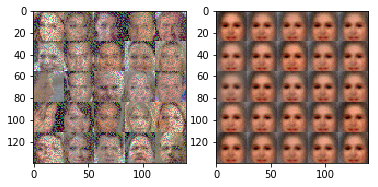

dis_loss: 0.00001986, en_loss: 23.60388374, temp_en_loss_dis: 23.46403313, recon_loss: 0.1399
dis_loss: 0.00001373, en_loss: 23.98379517, temp_en_loss_dis: 23.80534363, recon_loss: 0.1785
dis_loss: 0.00019431, en_loss: 24.21305275, temp_en_loss_dis: 24.01375771, recon_loss: 0.1993
dis_loss: 0.00005857, en_loss: 24.56581497, temp_en_loss_dis: 24.46282959, recon_loss: 0.1030
dis_loss: 0.00007069, en_loss: 24.56736183, temp_en_loss_dis: 24.38591385, recon_loss: 0.1814
dis_loss: 0.00006301, en_loss: 25.16319466, temp_en_loss_dis: 25.02404022, recon_loss: 0.1392
dis_loss: 0.00002706, en_loss: 24.89261436, temp_en_loss_dis: 24.73257065, recon_loss: 0.1600
dis_loss: 0.00009691, en_loss: 26.82274628, temp_en_loss_dis: 26.66615105, recon_loss: 0.1566
dis_loss: 0.00007109, en_loss: 26.87202263, temp_en_loss_dis: 26.65933228, recon_loss: 0.2127
dis_loss: 0.00038162, en_loss: 27.73077393, temp_en_loss_dis: 27.57188416, recon_loss: 0.1589
######### what? the reconstruction mse is: 0.1835


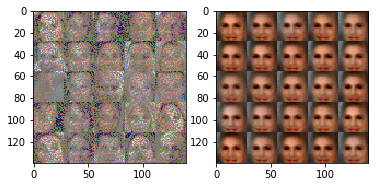

dis_loss: 0.00001307, en_loss: 28.25927162, temp_en_loss_dis: 28.10391045, recon_loss: 0.1554
dis_loss: 0.00012109, en_loss: 27.00377083, temp_en_loss_dis: 26.86594200, recon_loss: 0.1378
dis_loss: 0.00001483, en_loss: 27.74432755, temp_en_loss_dis: 27.52138901, recon_loss: 0.2229
dis_loss: 0.00078737, en_loss: 27.73068428, temp_en_loss_dis: 27.59004211, recon_loss: 0.1406
dis_loss: 0.00009091, en_loss: 28.15222359, temp_en_loss_dis: 27.94891357, recon_loss: 0.2033
dis_loss: 0.00022377, en_loss: 28.78894997, temp_en_loss_dis: 28.62436867, recon_loss: 0.1646
dis_loss: 0.00006205, en_loss: 27.49934578, temp_en_loss_dis: 27.34246635, recon_loss: 0.1569
dis_loss: 0.00012444, en_loss: 28.23919678, temp_en_loss_dis: 28.09597397, recon_loss: 0.1432
dis_loss: 0.00012621, en_loss: 29.30807495, temp_en_loss_dis: 29.15733337, recon_loss: 0.1507
dis_loss: 0.00037300, en_loss: 27.68568230, temp_en_loss_dis: 27.52235413, recon_loss: 0.1633
######### what? the reconstruction mse is: 0.1114


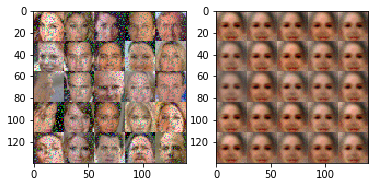

dis_loss: 0.00003648, en_loss: 27.51177979, temp_en_loss_dis: 27.37275124, recon_loss: 0.1390
dis_loss: 0.00049790, en_loss: 26.98080254, temp_en_loss_dis: 26.85499954, recon_loss: 0.1258
dis_loss: 0.00017794, en_loss: 29.00134087, temp_en_loss_dis: 28.87323380, recon_loss: 0.1281
dis_loss: 0.00143763, en_loss: 29.74500084, temp_en_loss_dis: 29.55667877, recon_loss: 0.1883
dis_loss: 0.00009944, en_loss: 28.65458488, temp_en_loss_dis: 28.53205299, recon_loss: 0.1225
dis_loss: 0.00005155, en_loss: 29.68040085, temp_en_loss_dis: 29.54802322, recon_loss: 0.1324
dis_loss: 0.00031528, en_loss: 28.26284409, temp_en_loss_dis: 28.10440826, recon_loss: 0.1584
dis_loss: 0.00039976, en_loss: 28.45241165, temp_en_loss_dis: 28.32362938, recon_loss: 0.1288
dis_loss: 0.00009294, en_loss: 29.44612312, temp_en_loss_dis: 29.25017738, recon_loss: 0.1959
dis_loss: 0.00015478, en_loss: 29.73460770, temp_en_loss_dis: 29.57915306, recon_loss: 0.1555
######### what? the reconstruction mse is: 0.0812


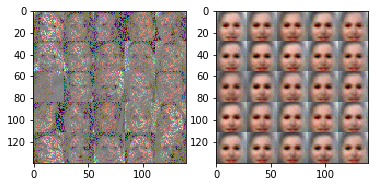

dis_loss: 0.00004649, en_loss: 29.68785667, temp_en_loss_dis: 29.57473946, recon_loss: 0.1131
dis_loss: 0.00006486, en_loss: 30.13949776, temp_en_loss_dis: 29.96226311, recon_loss: 0.1772
dis_loss: 0.00006861, en_loss: 30.90596390, temp_en_loss_dis: 30.71402740, recon_loss: 0.1919
dis_loss: 0.00009221, en_loss: 31.35269356, temp_en_loss_dis: 31.16921425, recon_loss: 0.1835
dis_loss: 0.00009778, en_loss: 31.02218246, temp_en_loss_dis: 30.91212845, recon_loss: 0.1101
dis_loss: 0.00001328, en_loss: 32.54027557, temp_en_loss_dis: 32.34680939, recon_loss: 0.1935
dis_loss: 0.00200828, en_loss: 32.12258911, temp_en_loss_dis: 31.94114685, recon_loss: 0.1814
dis_loss: 0.00017826, en_loss: 30.75019836, temp_en_loss_dis: 30.59000015, recon_loss: 0.1602
dis_loss: 0.00003320, en_loss: 31.22677803, temp_en_loss_dis: 31.03697586, recon_loss: 0.1898
dis_loss: 0.00024784, en_loss: 31.65793228, temp_en_loss_dis: 31.50127792, recon_loss: 0.1567
######### what? the reconstruction mse is: 0.0694


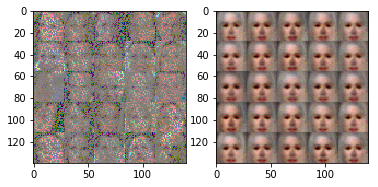

dis_loss: 0.00002326, en_loss: 31.14893913, temp_en_loss_dis: 31.02841949, recon_loss: 0.1205
dis_loss: 0.00057172, en_loss: 31.53545952, temp_en_loss_dis: 31.37583160, recon_loss: 0.1596
dis_loss: 0.00001097, en_loss: 31.49756241, temp_en_loss_dis: 31.28372574, recon_loss: 0.2138
dis_loss: 0.00009914, en_loss: 31.91396904, temp_en_loss_dis: 31.74291229, recon_loss: 0.1711
dis_loss: 0.00003997, en_loss: 31.79362869, temp_en_loss_dis: 31.62598801, recon_loss: 0.1676
dis_loss: 0.00007374, en_loss: 31.79101753, temp_en_loss_dis: 31.64791298, recon_loss: 0.1431
dis_loss: 0.00005025, en_loss: 33.53750610, temp_en_loss_dis: 33.29515839, recon_loss: 0.2423
dis_loss: 0.00538268, en_loss: 33.41120529, temp_en_loss_dis: 33.23523712, recon_loss: 0.1760
dis_loss: 0.00001705, en_loss: 32.48432159, temp_en_loss_dis: 32.34616089, recon_loss: 0.1382
dis_loss: 0.00039716, en_loss: 32.20106125, temp_en_loss_dis: 32.00602722, recon_loss: 0.1950
######### what? the reconstruction mse is: 0.0938


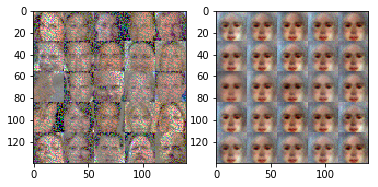

dis_loss: 0.00005732, en_loss: 32.06357574, temp_en_loss_dis: 31.85842896, recon_loss: 0.2051
dis_loss: 0.00009788, en_loss: 31.59394836, temp_en_loss_dis: 31.43763733, recon_loss: 0.1563
dis_loss: 0.00008874, en_loss: 32.65710831, temp_en_loss_dis: 32.46953201, recon_loss: 0.1876
dis_loss: 0.00044072, en_loss: 34.30417252, temp_en_loss_dis: 34.14303589, recon_loss: 0.1611
dis_loss: 0.00018013, en_loss: 33.33992767, temp_en_loss_dis: 33.15841675, recon_loss: 0.1815
dis_loss: 0.00010465, en_loss: 33.84244156, temp_en_loss_dis: 33.71395111, recon_loss: 0.1285
dis_loss: 0.00002087, en_loss: 34.52505112, temp_en_loss_dis: 34.35271454, recon_loss: 0.1723
dis_loss: 0.00001683, en_loss: 34.62793350, temp_en_loss_dis: 34.38867569, recon_loss: 0.2393
dis_loss: 0.00001152, en_loss: 33.97739029, temp_en_loss_dis: 33.83914185, recon_loss: 0.1383
dis_loss: 0.00009506, en_loss: 33.77875519, temp_en_loss_dis: 33.63182831, recon_loss: 0.1469
######### what? the reconstruction mse is: 0.1881


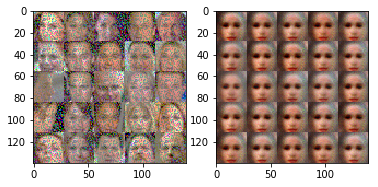

dis_loss: 0.00016001, en_loss: 33.19388199, temp_en_loss_dis: 33.00743866, recon_loss: 0.1864
dis_loss: 0.00023547, en_loss: 32.74178314, temp_en_loss_dis: 32.55227280, recon_loss: 0.1895
dis_loss: 0.00009668, en_loss: 32.71750641, temp_en_loss_dis: 32.60768127, recon_loss: 0.1098
dis_loss: 0.00016378, en_loss: 32.89888000, temp_en_loss_dis: 32.73793793, recon_loss: 0.1609
dis_loss: 0.00006722, en_loss: 35.04380035, temp_en_loss_dis: 34.84566498, recon_loss: 0.1981
dis_loss: 0.00029647, en_loss: 33.51219559, temp_en_loss_dis: 33.37532806, recon_loss: 0.1369
dis_loss: 0.00044191, en_loss: 33.07848358, temp_en_loss_dis: 32.90421295, recon_loss: 0.1743
dis_loss: 0.00039295, en_loss: 34.47719574, temp_en_loss_dis: 34.27475739, recon_loss: 0.2024
dis_loss: 0.00017632, en_loss: 36.25490189, temp_en_loss_dis: 36.07350922, recon_loss: 0.1814
dis_loss: 0.00009813, en_loss: 35.83639908, temp_en_loss_dis: 35.66444397, recon_loss: 0.1720
######### what? the reconstruction mse is: 0.1453


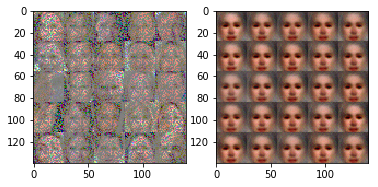

dis_loss: 0.00000926, en_loss: 37.47753525, temp_en_loss_dis: 37.33265686, recon_loss: 0.1449
dis_loss: 0.00000753, en_loss: 37.47743225, temp_en_loss_dis: 37.33735275, recon_loss: 0.1401
dis_loss: 0.00002941, en_loss: 37.31349182, temp_en_loss_dis: 37.11380005, recon_loss: 0.1997
dis_loss: 0.00020910, en_loss: 37.08601761, temp_en_loss_dis: 36.90946198, recon_loss: 0.1766
dis_loss: 0.00021548, en_loss: 36.06653214, temp_en_loss_dis: 35.85651398, recon_loss: 0.2100
dis_loss: 0.00025788, en_loss: 35.85770416, temp_en_loss_dis: 35.71479034, recon_loss: 0.1429
dis_loss: 0.00007080, en_loss: 37.11303329, temp_en_loss_dis: 36.93051529, recon_loss: 0.1825
dis_loss: 0.00001287, en_loss: 36.95658112, temp_en_loss_dis: 36.80923462, recon_loss: 0.1473
dis_loss: 0.00011604, en_loss: 36.50770950, temp_en_loss_dis: 36.31872559, recon_loss: 0.1890
dis_loss: 0.00007139, en_loss: 36.80944824, temp_en_loss_dis: 36.71664047, recon_loss: 0.0928
######### what? the reconstruction mse is: 0.0989


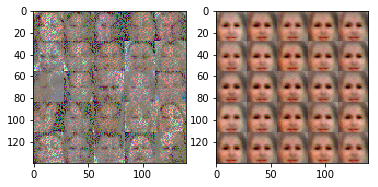

dis_loss: 0.00043651, en_loss: 35.12058258, temp_en_loss_dis: 34.95653534, recon_loss: 0.1640
dis_loss: 0.00001053, en_loss: 36.70010757, temp_en_loss_dis: 36.52434540, recon_loss: 0.1758
dis_loss: 0.00001970, en_loss: 37.15909958, temp_en_loss_dis: 37.06195068, recon_loss: 0.0971
dis_loss: 0.00000987, en_loss: 38.61724472, temp_en_loss_dis: 38.46358871, recon_loss: 0.1537
dis_loss: 0.00001205, en_loss: 38.65877151, temp_en_loss_dis: 38.50914001, recon_loss: 0.1496
dis_loss: 0.00036844, en_loss: 39.17428589, temp_en_loss_dis: 38.95175552, recon_loss: 0.2225
dis_loss: 0.00032543, en_loss: 39.38441086, temp_en_loss_dis: 39.22637558, recon_loss: 0.1580
dis_loss: 0.00006935, en_loss: 39.30086517, temp_en_loss_dis: 39.16508484, recon_loss: 0.1358
dis_loss: 0.00015594, en_loss: 39.22000885, temp_en_loss_dis: 39.02622986, recon_loss: 0.1938
dis_loss: 0.00000161, en_loss: 41.08742905, temp_en_loss_dis: 40.93288422, recon_loss: 0.1545
######### what? the reconstruction mse is: 0.1362


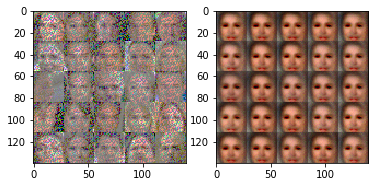

dis_loss: 0.00000543, en_loss: 41.47344971, temp_en_loss_dis: 41.33453369, recon_loss: 0.1389
dis_loss: 0.00000197, en_loss: 40.42822647, temp_en_loss_dis: 40.35190964, recon_loss: 0.0763
dis_loss: 0.00140682, en_loss: 39.66441727, temp_en_loss_dis: 39.49832153, recon_loss: 0.1661
dis_loss: 0.00001598, en_loss: 40.44614029, temp_en_loss_dis: 40.28206635, recon_loss: 0.1641
dis_loss: 0.00001406, en_loss: 40.34488297, temp_en_loss_dis: 40.15831757, recon_loss: 0.1866
dis_loss: 0.00013897, en_loss: 41.54448318, temp_en_loss_dis: 41.36097336, recon_loss: 0.1835
dis_loss: 0.00010442, en_loss: 42.41906738, temp_en_loss_dis: 42.26737213, recon_loss: 0.1517
dis_loss: 0.00018352, en_loss: 41.99351883, temp_en_loss_dis: 41.82564926, recon_loss: 0.1679
dis_loss: 0.00000363, en_loss: 42.48684692, temp_en_loss_dis: 42.33311462, recon_loss: 0.1537
dis_loss: 0.00000485, en_loss: 43.56505966, temp_en_loss_dis: 43.31620026, recon_loss: 0.2489
######### what? the reconstruction mse is: 0.1269


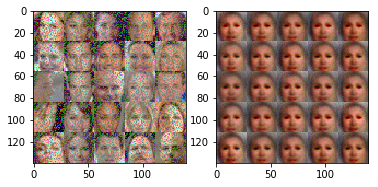

dis_loss: 0.00005762, en_loss: 43.57753754, temp_en_loss_dis: 43.41530609, recon_loss: 0.1622
dis_loss: 0.00003348, en_loss: 42.06064606, temp_en_loss_dis: 41.93026733, recon_loss: 0.1304
dis_loss: 0.00027211, en_loss: 43.29755402, temp_en_loss_dis: 43.17696381, recon_loss: 0.1206
dis_loss: 0.00069536, en_loss: 42.61235809, temp_en_loss_dis: 42.47913742, recon_loss: 0.1332
dis_loss: 0.00002235, en_loss: 40.32812500, temp_en_loss_dis: 40.14322662, recon_loss: 0.1849
dis_loss: 0.00059503, en_loss: 41.22932434, temp_en_loss_dis: 41.04673767, recon_loss: 0.1826
dis_loss: 0.00030141, en_loss: 41.30072403, temp_en_loss_dis: 41.18420410, recon_loss: 0.1165
dis_loss: 0.00031650, en_loss: 40.84563065, temp_en_loss_dis: 40.72581100, recon_loss: 0.1198
dis_loss: 0.00028608, en_loss: 41.02147293, temp_en_loss_dis: 40.89410782, recon_loss: 0.1274
dis_loss: 0.00013710, en_loss: 41.88311386, temp_en_loss_dis: 41.73676300, recon_loss: 0.1464
######### what? the reconstruction mse is: 0.1243


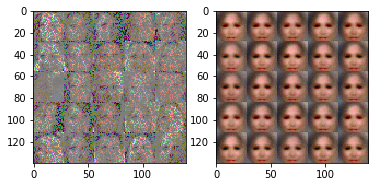

dis_loss: 0.00007306, en_loss: 43.36662674, temp_en_loss_dis: 43.20106506, recon_loss: 0.1656
dis_loss: 0.00015783, en_loss: 43.54999161, temp_en_loss_dis: 43.43167877, recon_loss: 0.1183
dis_loss: 0.00007588, en_loss: 42.94459152, temp_en_loss_dis: 42.75438690, recon_loss: 0.1902
dis_loss: 0.00000397, en_loss: 43.33045578, temp_en_loss_dis: 43.17747498, recon_loss: 0.1530
dis_loss: 0.00008772, en_loss: 43.70191956, temp_en_loss_dis: 43.56027985, recon_loss: 0.1416
dis_loss: 0.00002599, en_loss: 45.83993530, temp_en_loss_dis: 45.71715546, recon_loss: 0.1228
dis_loss: 0.00021930, en_loss: 45.03458405, temp_en_loss_dis: 44.83999634, recon_loss: 0.1946
dis_loss: 0.00016055, en_loss: 45.21453476, temp_en_loss_dis: 45.06805420, recon_loss: 0.1465
dis_loss: 0.00016801, en_loss: 46.68225479, temp_en_loss_dis: 46.55154419, recon_loss: 0.1307
dis_loss: 0.00000941, en_loss: 45.08420944, temp_en_loss_dis: 44.92613220, recon_loss: 0.1581
######### what? the reconstruction mse is: 0.1533


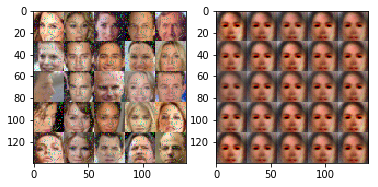

dis_loss: 0.00005588, en_loss: 44.57703400, temp_en_loss_dis: 44.40767670, recon_loss: 0.1694
dis_loss: 0.00000154, en_loss: 43.73145294, temp_en_loss_dis: 43.57553101, recon_loss: 0.1559
dis_loss: 0.00001505, en_loss: 45.16334152, temp_en_loss_dis: 44.97586060, recon_loss: 0.1875
dis_loss: 0.00003153, en_loss: 48.08458328, temp_en_loss_dis: 47.91690063, recon_loss: 0.1677
dis_loss: 0.00001431, en_loss: 46.64371109, temp_en_loss_dis: 46.45544052, recon_loss: 0.1883
dis_loss: 0.00035124, en_loss: 47.15536499, temp_en_loss_dis: 46.97766876, recon_loss: 0.1777
dis_loss: 0.00000021, en_loss: 48.09793854, temp_en_loss_dis: 47.93248749, recon_loss: 0.1654
dis_loss: 0.00001778, en_loss: 47.64151001, temp_en_loss_dis: 47.46037292, recon_loss: 0.1811
dis_loss: 0.00000137, en_loss: 47.57360458, temp_en_loss_dis: 47.48768616, recon_loss: 0.0859
dis_loss: 0.00001377, en_loss: 47.63772964, temp_en_loss_dis: 47.46012115, recon_loss: 0.1776
######### what? the reconstruction mse is: 0.1141


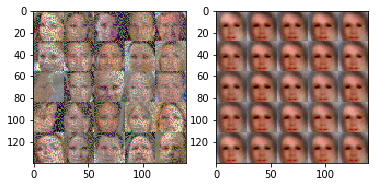

dis_loss: 0.00004246, en_loss: 47.83033371, temp_en_loss_dis: 47.65710831, recon_loss: 0.1732
dis_loss: 0.00000245, en_loss: 45.61703873, temp_en_loss_dis: 45.42196655, recon_loss: 0.1951
dis_loss: 0.00005056, en_loss: 48.40846634, temp_en_loss_dis: 48.22881317, recon_loss: 0.1797
dis_loss: 0.00032483, en_loss: 48.28498840, temp_en_loss_dis: 48.08996201, recon_loss: 0.1950
dis_loss: 0.00000060, en_loss: 49.87714767, temp_en_loss_dis: 49.68603516, recon_loss: 0.1911
dis_loss: 0.00000737, en_loss: 49.71170807, temp_en_loss_dis: 49.51486969, recon_loss: 0.1968
dis_loss: 0.00002640, en_loss: 48.74422455, temp_en_loss_dis: 48.59600067, recon_loss: 0.1482
dis_loss: 0.00016960, en_loss: 48.04083633, temp_en_loss_dis: 47.85151291, recon_loss: 0.1893
dis_loss: 0.00095827, en_loss: 49.12436295, temp_en_loss_dis: 48.99873352, recon_loss: 0.1256
dis_loss: 0.00001280, en_loss: 50.38489914, temp_en_loss_dis: 50.22337341, recon_loss: 0.1615
######### what? the reconstruction mse is: 0.1500


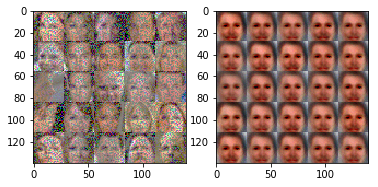

dis_loss: 0.00002591, en_loss: 52.19823456, temp_en_loss_dis: 51.98702240, recon_loss: 0.2112
dis_loss: 0.00005142, en_loss: 52.06903076, temp_en_loss_dis: 51.86819077, recon_loss: 0.2008
dis_loss: 0.00061366, en_loss: 51.51257706, temp_en_loss_dis: 51.31476212, recon_loss: 0.1978
dis_loss: 0.00001579, en_loss: 53.00105286, temp_en_loss_dis: 52.83943176, recon_loss: 0.1616
dis_loss: 0.00009034, en_loss: 52.51146698, temp_en_loss_dis: 52.34770966, recon_loss: 0.1638
dis_loss: 0.00023179, en_loss: 53.85733032, temp_en_loss_dis: 53.70208740, recon_loss: 0.1552
dis_loss: 0.00000396, en_loss: 53.25929642, temp_en_loss_dis: 53.09945679, recon_loss: 0.1598
dis_loss: 0.00013289, en_loss: 53.94042587, temp_en_loss_dis: 53.72054291, recon_loss: 0.2199
dis_loss: 0.00000037, en_loss: 53.65916443, temp_en_loss_dis: 53.51589584, recon_loss: 0.1433
dis_loss: 0.00000774, en_loss: 54.19627762, temp_en_loss_dis: 54.04345322, recon_loss: 0.1528
######### what? the reconstruction mse is: 0.1847


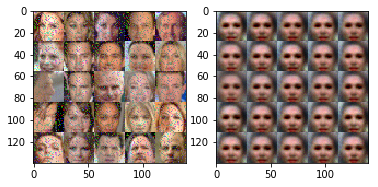

dis_loss: 0.00021112, en_loss: 53.32414246, temp_en_loss_dis: 53.18593597, recon_loss: 0.1382
dis_loss: 0.00000712, en_loss: 53.99383163, temp_en_loss_dis: 53.83681488, recon_loss: 0.1570
dis_loss: 0.00001259, en_loss: 53.39296722, temp_en_loss_dis: 53.19125366, recon_loss: 0.2017
dis_loss: 0.00001218, en_loss: 54.07056427, temp_en_loss_dis: 53.93310547, recon_loss: 0.1375
dis_loss: 0.00013457, en_loss: 55.29127121, temp_en_loss_dis: 55.11154938, recon_loss: 0.1797
dis_loss: 0.00012328, en_loss: 53.01523972, temp_en_loss_dis: 52.85080719, recon_loss: 0.1644
dis_loss: 0.00002206, en_loss: 52.02423859, temp_en_loss_dis: 51.84947586, recon_loss: 0.1748
dis_loss: 0.00010574, en_loss: 53.05673981, temp_en_loss_dis: 52.86542511, recon_loss: 0.1913
dis_loss: 0.00018388, en_loss: 55.00120544, temp_en_loss_dis: 54.85899734, recon_loss: 0.1422
dis_loss: 0.00000750, en_loss: 56.28315353, temp_en_loss_dis: 56.10277176, recon_loss: 0.1804
######### what? the reconstruction mse is: 0.1298


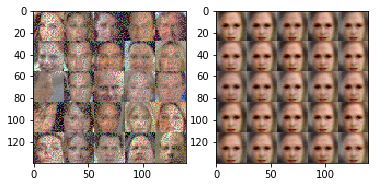

dis_loss: 0.00010158, en_loss: 56.00712204, temp_en_loss_dis: 55.77887726, recon_loss: 0.2282
dis_loss: 0.00006115, en_loss: 56.21044922, temp_en_loss_dis: 56.02172470, recon_loss: 0.1887
dis_loss: 0.00002896, en_loss: 56.69519424, temp_en_loss_dis: 56.56501770, recon_loss: 0.1302
dis_loss: 0.00000159, en_loss: 58.20506668, temp_en_loss_dis: 58.05670166, recon_loss: 0.1484
dis_loss: 0.00004391, en_loss: 57.92290115, temp_en_loss_dis: 57.75114059, recon_loss: 0.1718
dis_loss: 0.00000205, en_loss: 57.36799240, temp_en_loss_dis: 57.22563171, recon_loss: 0.1424
dis_loss: 0.00004069, en_loss: 54.95122147, temp_en_loss_dis: 54.78445435, recon_loss: 0.1668
dis_loss: 0.00043067, en_loss: 56.17034912, temp_en_loss_dis: 55.97230530, recon_loss: 0.1980
dis_loss: 0.00000020, en_loss: 56.54940033, temp_en_loss_dis: 56.35125732, recon_loss: 0.1981
dis_loss: 0.00014941, en_loss: 56.14126205, temp_en_loss_dis: 55.99312592, recon_loss: 0.1481
######### what? the reconstruction mse is: 0.1501


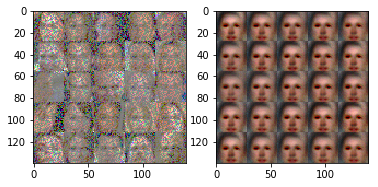

dis_loss: 0.00000797, en_loss: 54.39601135, temp_en_loss_dis: 54.24684143, recon_loss: 0.1492
dis_loss: 0.00023853, en_loss: 53.68812943, temp_en_loss_dis: 53.51615906, recon_loss: 0.1720
dis_loss: 0.00001062, en_loss: 55.48128128, temp_en_loss_dis: 55.34526825, recon_loss: 0.1360
dis_loss: 0.00037005, en_loss: 56.52968216, temp_en_loss_dis: 56.39398575, recon_loss: 0.1357
dis_loss: 0.00031829, en_loss: 57.03621292, temp_en_loss_dis: 56.84600830, recon_loss: 0.1902
dis_loss: 0.00819553, en_loss: 58.10411835, temp_en_loss_dis: 57.95342255, recon_loss: 0.1507
dis_loss: 0.00002259, en_loss: 57.24042130, temp_en_loss_dis: 57.14672089, recon_loss: 0.0937
dis_loss: 0.00000169, en_loss: 56.56043243, temp_en_loss_dis: 56.36715698, recon_loss: 0.1933
dis_loss: 0.00012770, en_loss: 55.72423553, temp_en_loss_dis: 55.56126022, recon_loss: 0.1630
dis_loss: 0.00036247, en_loss: 55.95527267, temp_en_loss_dis: 55.80104828, recon_loss: 0.1542
######### what? the reconstruction mse is: 0.2312


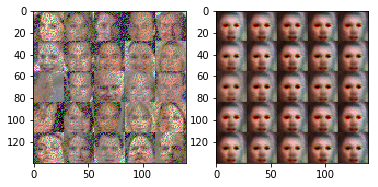

dis_loss: 0.00015366, en_loss: 55.95446777, temp_en_loss_dis: 55.80548096, recon_loss: 0.1490
dis_loss: 0.00004448, en_loss: 56.28474045, temp_en_loss_dis: 56.19823074, recon_loss: 0.0865
dis_loss: 0.00000338, en_loss: 56.20194244, temp_en_loss_dis: 56.04605484, recon_loss: 0.1559
dis_loss: 0.00002598, en_loss: 54.58731079, temp_en_loss_dis: 54.44023895, recon_loss: 0.1471
dis_loss: 0.00210147, en_loss: 57.06259537, temp_en_loss_dis: 56.90609360, recon_loss: 0.1565
dis_loss: 0.00005467, en_loss: 54.77338028, temp_en_loss_dis: 54.68130112, recon_loss: 0.0921
dis_loss: 0.00003931, en_loss: 54.47574615, temp_en_loss_dis: 54.27237701, recon_loss: 0.2034
dis_loss: 0.00000667, en_loss: 57.10251617, temp_en_loss_dis: 56.96104431, recon_loss: 0.1415
dis_loss: 0.00022767, en_loss: 57.75645828, temp_en_loss_dis: 57.55023193, recon_loss: 0.2062
dis_loss: 0.00009653, en_loss: 57.63581848, temp_en_loss_dis: 57.52615356, recon_loss: 0.1097
######### what? the reconstruction mse is: 0.2267


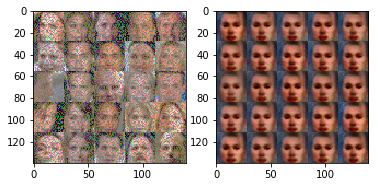

dis_loss: 0.00037853, en_loss: 57.51347351, temp_en_loss_dis: 57.40766144, recon_loss: 0.1058
dis_loss: 0.00044573, en_loss: 56.99225998, temp_en_loss_dis: 56.78081894, recon_loss: 0.2114
dis_loss: 0.00021973, en_loss: 58.75039291, temp_en_loss_dis: 58.57506943, recon_loss: 0.1753
dis_loss: 0.00000077, en_loss: 59.38861465, temp_en_loss_dis: 59.21897125, recon_loss: 0.1696
dis_loss: 0.00000041, en_loss: 59.47906494, temp_en_loss_dis: 59.30735016, recon_loss: 0.1717
dis_loss: 0.00000188, en_loss: 60.12278748, temp_en_loss_dis: 59.93931580, recon_loss: 0.1835
dis_loss: 0.00002995, en_loss: 60.41179657, temp_en_loss_dis: 60.24090576, recon_loss: 0.1709
dis_loss: 0.00004615, en_loss: 61.23917389, temp_en_loss_dis: 61.05648804, recon_loss: 0.1827
dis_loss: 0.00000011, en_loss: 58.80966568, temp_en_loss_dis: 58.62660980, recon_loss: 0.1831
dis_loss: 0.00275510, en_loss: 57.87916183, temp_en_loss_dis: 57.69902802, recon_loss: 0.1801
######### what? the reconstruction mse is: 0.1619


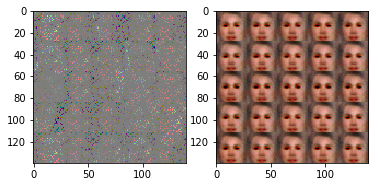

dis_loss: 0.00000120, en_loss: 59.66255569, temp_en_loss_dis: 59.53976822, recon_loss: 0.1228
dis_loss: 0.00004977, en_loss: 59.64326096, temp_en_loss_dis: 59.44791794, recon_loss: 0.1953
dis_loss: 0.00000165, en_loss: 60.81670761, temp_en_loss_dis: 60.62174988, recon_loss: 0.1950
dis_loss: 0.00000324, en_loss: 59.20661545, temp_en_loss_dis: 59.00009155, recon_loss: 0.2065
dis_loss: 0.00019775, en_loss: 61.70200348, temp_en_loss_dis: 61.50921631, recon_loss: 0.1928
dis_loss: 0.00000578, en_loss: 60.80176544, temp_en_loss_dis: 60.64254761, recon_loss: 0.1592
dis_loss: 0.00005212, en_loss: 60.95404434, temp_en_loss_dis: 60.79782867, recon_loss: 0.1562
dis_loss: 0.00026783, en_loss: 63.39294815, temp_en_loss_dis: 63.29571915, recon_loss: 0.0972
dis_loss: 0.00000569, en_loss: 61.91090393, temp_en_loss_dis: 61.74089813, recon_loss: 0.1700
dis_loss: 0.00062696, en_loss: 62.01968002, temp_en_loss_dis: 61.85227966, recon_loss: 0.1674
######### what? the reconstruction mse is: 0.2403


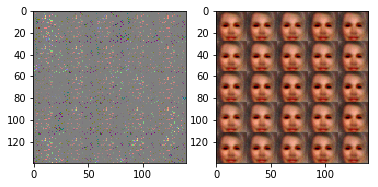

dis_loss: 0.00000026, en_loss: 63.42676544, temp_en_loss_dis: 63.22008133, recon_loss: 0.2067
dis_loss: 0.00000654, en_loss: 62.28130341, temp_en_loss_dis: 62.08601379, recon_loss: 0.1953
dis_loss: 0.00000236, en_loss: 63.03234863, temp_en_loss_dis: 62.87609100, recon_loss: 0.1563
dis_loss: 0.00000029, en_loss: 63.43112946, temp_en_loss_dis: 63.30048752, recon_loss: 0.1306
dis_loss: 0.00003401, en_loss: 65.23113251, temp_en_loss_dis: 65.03695679, recon_loss: 0.1942
dis_loss: 0.00102442, en_loss: 65.48587036, temp_en_loss_dis: 65.29798889, recon_loss: 0.1879
dis_loss: 0.00012108, en_loss: 63.03253937, temp_en_loss_dis: 62.86299515, recon_loss: 0.1695
dis_loss: 0.00013331, en_loss: 60.58931732, temp_en_loss_dis: 60.42760468, recon_loss: 0.1617
dis_loss: 0.00055894, en_loss: 60.25939560, temp_en_loss_dis: 60.08961868, recon_loss: 0.1698
dis_loss: 0.00017803, en_loss: 60.44906616, temp_en_loss_dis: 60.29057693, recon_loss: 0.1585
######### what? the reconstruction mse is: 0.1838


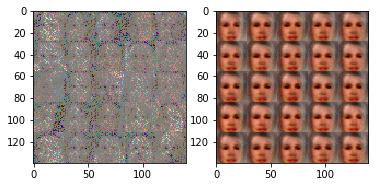

dis_loss: 0.00000059, en_loss: 61.07947159, temp_en_loss_dis: 60.89017105, recon_loss: 0.1893
dis_loss: 0.00007606, en_loss: 60.39939117, temp_en_loss_dis: 60.23672485, recon_loss: 0.1627
dis_loss: 0.00000302, en_loss: 61.36915970, temp_en_loss_dis: 61.20806122, recon_loss: 0.1611
dis_loss: 0.00000024, en_loss: 62.11690903, temp_en_loss_dis: 61.90114594, recon_loss: 0.2158
dis_loss: 0.00000008, en_loss: 62.91971588, temp_en_loss_dis: 62.75634003, recon_loss: 0.1634
dis_loss: 0.00017849, en_loss: 61.08215714, temp_en_loss_dis: 60.94512939, recon_loss: 0.1370
dis_loss: 0.00000029, en_loss: 62.33132172, temp_en_loss_dis: 62.16213608, recon_loss: 0.1692
dis_loss: 0.00000096, en_loss: 62.04079437, temp_en_loss_dis: 61.86079025, recon_loss: 0.1800
dis_loss: 0.00002173, en_loss: 63.52003860, temp_en_loss_dis: 63.35580444, recon_loss: 0.1642
dis_loss: 0.00002798, en_loss: 62.06945801, temp_en_loss_dis: 61.89941025, recon_loss: 0.1700
######### what? the reconstruction mse is: 0.2034


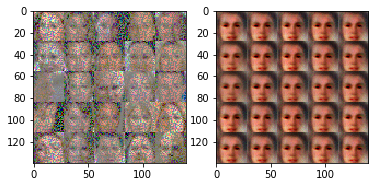

dis_loss: 0.00051521, en_loss: 62.34642792, temp_en_loss_dis: 62.15707397, recon_loss: 0.1894
dis_loss: 0.00000002, en_loss: 62.35525513, temp_en_loss_dis: 62.14968109, recon_loss: 0.2056
dis_loss: 0.00027252, en_loss: 61.68774414, temp_en_loss_dis: 61.49176788, recon_loss: 0.1960
dis_loss: 0.00024618, en_loss: 62.67270660, temp_en_loss_dis: 62.51425171, recon_loss: 0.1585
dis_loss: 0.00000351, en_loss: 63.11874008, temp_en_loss_dis: 62.94446564, recon_loss: 0.1743
dis_loss: 0.00012898, en_loss: 64.83512878, temp_en_loss_dis: 64.72106934, recon_loss: 0.1141
dis_loss: 0.00008269, en_loss: 64.49354553, temp_en_loss_dis: 64.31501007, recon_loss: 0.1785
dis_loss: 0.00000336, en_loss: 64.98709106, temp_en_loss_dis: 64.84521484, recon_loss: 0.1419
dis_loss: 0.00000181, en_loss: 65.08878326, temp_en_loss_dis: 64.94795227, recon_loss: 0.1408
dis_loss: 0.00006005, en_loss: 65.85623932, temp_en_loss_dis: 65.69535828, recon_loss: 0.1609
######### what? the reconstruction mse is: 0.1653


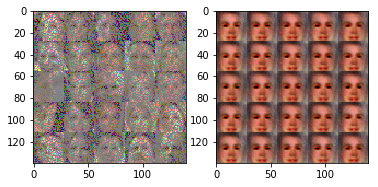

dis_loss: 0.00024476, en_loss: 65.98593903, temp_en_loss_dis: 65.85629272, recon_loss: 0.1296
dis_loss: 0.00013523, en_loss: 65.54766083, temp_en_loss_dis: 65.35235596, recon_loss: 0.1953
dis_loss: 0.00000035, en_loss: 66.59067535, temp_en_loss_dis: 66.48390198, recon_loss: 0.1068
dis_loss: 0.00013104, en_loss: 66.40425873, temp_en_loss_dis: 66.25051880, recon_loss: 0.1537
dis_loss: 0.00012766, en_loss: 67.65956879, temp_en_loss_dis: 67.46863556, recon_loss: 0.1909
dis_loss: 0.00000502, en_loss: 67.72653198, temp_en_loss_dis: 67.60492706, recon_loss: 0.1216
dis_loss: 0.00001287, en_loss: 67.79107666, temp_en_loss_dis: 67.59004211, recon_loss: 0.2010
dis_loss: 0.00000267, en_loss: 66.11264038, temp_en_loss_dis: 65.91726685, recon_loss: 0.1954
dis_loss: 0.00001814, en_loss: 67.96875763, temp_en_loss_dis: 67.78448486, recon_loss: 0.1843
dis_loss: 0.00000009, en_loss: 68.01891327, temp_en_loss_dis: 67.79427338, recon_loss: 0.2246
######### what? the reconstruction mse is: 0.2584


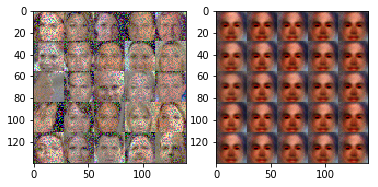

dis_loss: 0.00000006, en_loss: 68.28020477, temp_en_loss_dis: 68.14017487, recon_loss: 0.1400
dis_loss: 0.00014171, en_loss: 67.88807678, temp_en_loss_dis: 67.67800903, recon_loss: 0.2101
dis_loss: 0.00001197, en_loss: 68.20987701, temp_en_loss_dis: 68.04003906, recon_loss: 0.1698
dis_loss: 0.00000033, en_loss: 70.53667450, temp_en_loss_dis: 70.33347321, recon_loss: 0.2032
dis_loss: 0.00024619, en_loss: 68.24018097, temp_en_loss_dis: 68.04260254, recon_loss: 0.1976
dis_loss: 0.00002904, en_loss: 67.66345978, temp_en_loss_dis: 67.50393677, recon_loss: 0.1595
dis_loss: 0.00001611, en_loss: 67.82410431, temp_en_loss_dis: 67.66534424, recon_loss: 0.1588
dis_loss: 0.00007837, en_loss: 66.73900604, temp_en_loss_dis: 66.58374023, recon_loss: 0.1553
dis_loss: 0.00000107, en_loss: 70.38829803, temp_en_loss_dis: 70.18034363, recon_loss: 0.2080
dis_loss: 0.00024669, en_loss: 70.84507751, temp_en_loss_dis: 70.66580200, recon_loss: 0.1793
######### what? the reconstruction mse is: 0.1873


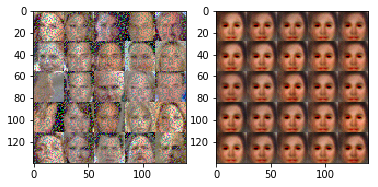

dis_loss: 0.00000946, en_loss: 70.92328644, temp_en_loss_dis: 70.70363617, recon_loss: 0.2197
dis_loss: 0.00001295, en_loss: 71.77881622, temp_en_loss_dis: 71.60677338, recon_loss: 0.1720
dis_loss: 0.00000083, en_loss: 71.75733948, temp_en_loss_dis: 71.58042908, recon_loss: 0.1769
dis_loss: 0.00000791, en_loss: 71.86372375, temp_en_loss_dis: 71.70108032, recon_loss: 0.1626
dis_loss: 0.00022271, en_loss: 69.98557281, temp_en_loss_dis: 69.84886169, recon_loss: 0.1367
dis_loss: 0.00008528, en_loss: 71.14082336, temp_en_loss_dis: 70.93928528, recon_loss: 0.2015
dis_loss: 0.00000009, en_loss: 71.62058258, temp_en_loss_dis: 71.42749023, recon_loss: 0.1931
dis_loss: 0.00000100, en_loss: 71.63254547, temp_en_loss_dis: 71.47634888, recon_loss: 0.1562
dis_loss: 0.00000016, en_loss: 71.35265350, temp_en_loss_dis: 71.18304443, recon_loss: 0.1696
dis_loss: 0.00001451, en_loss: 69.65827179, temp_en_loss_dis: 69.48707581, recon_loss: 0.1712
######### what? the reconstruction mse is: 0.1299


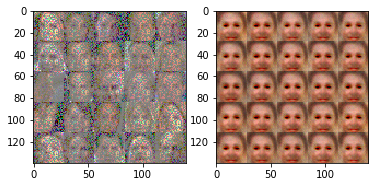

dis_loss: 0.00003390, en_loss: 68.28919220, temp_en_loss_dis: 68.16015625, recon_loss: 0.1290
dis_loss: 0.00000046, en_loss: 70.15979004, temp_en_loss_dis: 70.00025940, recon_loss: 0.1595
dis_loss: 0.00008286, en_loss: 69.96678162, temp_en_loss_dis: 69.83531952, recon_loss: 0.1315
dis_loss: 0.00002276, en_loss: 70.59057617, temp_en_loss_dis: 70.46458435, recon_loss: 0.1260
dis_loss: 0.00002852, en_loss: 70.36635590, temp_en_loss_dis: 70.20371246, recon_loss: 0.1626
dis_loss: 0.00000016, en_loss: 71.06610107, temp_en_loss_dis: 70.88450623, recon_loss: 0.1816
dis_loss: 0.00001111, en_loss: 71.62004089, temp_en_loss_dis: 71.45088196, recon_loss: 0.1692
dis_loss: 0.00010076, en_loss: 72.25813293, temp_en_loss_dis: 72.09141541, recon_loss: 0.1667
dis_loss: 0.00000007, en_loss: 73.32051849, temp_en_loss_dis: 73.17658997, recon_loss: 0.1439
dis_loss: 0.00000247, en_loss: 73.35927582, temp_en_loss_dis: 73.16635132, recon_loss: 0.1929
######### what? the reconstruction mse is: 0.1068


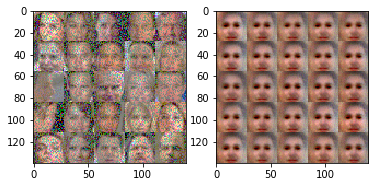

dis_loss: 0.00008395, en_loss: 71.52249146, temp_en_loss_dis: 71.39794922, recon_loss: 0.1245
dis_loss: 0.00014661, en_loss: 71.48831940, temp_en_loss_dis: 71.30410767, recon_loss: 0.1842
dis_loss: 0.00000294, en_loss: 72.19323730, temp_en_loss_dis: 72.03362274, recon_loss: 0.1596
dis_loss: 0.00003713, en_loss: 71.76425934, temp_en_loss_dis: 71.61713409, recon_loss: 0.1471
dis_loss: 0.00000149, en_loss: 74.03957367, temp_en_loss_dis: 73.86405182, recon_loss: 0.1755
dis_loss: 0.00000006, en_loss: 73.36591339, temp_en_loss_dis: 73.21895599, recon_loss: 0.1470
dis_loss: 0.00001277, en_loss: 73.27951050, temp_en_loss_dis: 73.14265442, recon_loss: 0.1369
dis_loss: 0.00008141, en_loss: 74.25719452, temp_en_loss_dis: 74.09097290, recon_loss: 0.1662
dis_loss: 0.00000136, en_loss: 74.42166138, temp_en_loss_dis: 74.30029297, recon_loss: 0.1214
dis_loss: 0.00000029, en_loss: 74.33757019, temp_en_loss_dis: 74.14309692, recon_loss: 0.1945
######### what? the reconstruction mse is: 0.1786


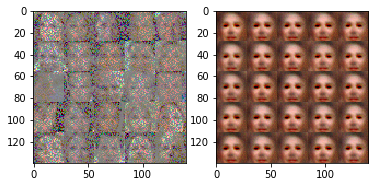

dis_loss: 0.00000265, en_loss: 74.61205292, temp_en_loss_dis: 74.46433258, recon_loss: 0.1477
dis_loss: 0.00000021, en_loss: 75.31044769, temp_en_loss_dis: 75.13834381, recon_loss: 0.1721
dis_loss: 0.00000339, en_loss: 74.95330811, temp_en_loss_dis: 74.78222656, recon_loss: 0.1711
dis_loss: 0.00000289, en_loss: 73.82294464, temp_en_loss_dis: 73.63113403, recon_loss: 0.1918
dis_loss: 0.00018849, en_loss: 70.38772583, temp_en_loss_dis: 70.18743134, recon_loss: 0.2003
dis_loss: 0.00010999, en_loss: 71.34281921, temp_en_loss_dis: 71.22271729, recon_loss: 0.1201
dis_loss: 0.00000157, en_loss: 72.90750885, temp_en_loss_dis: 72.71457672, recon_loss: 0.1929
dis_loss: 0.00006940, en_loss: 71.32317352, temp_en_loss_dis: 71.15892792, recon_loss: 0.1642
dis_loss: 0.00031551, en_loss: 69.53087616, temp_en_loss_dis: 69.36059570, recon_loss: 0.1703
dis_loss: 0.00038399, en_loss: 69.60705566, temp_en_loss_dis: 69.45914459, recon_loss: 0.1479
######### what? the reconstruction mse is: 0.1780


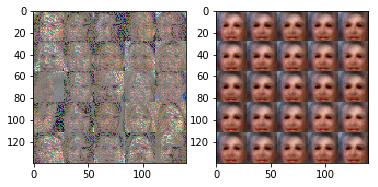

dis_loss: 0.00003847, en_loss: 69.60045624, temp_en_loss_dis: 69.45438385, recon_loss: 0.1461
dis_loss: 0.00001505, en_loss: 70.11763763, temp_en_loss_dis: 69.92225647, recon_loss: 0.1954
dis_loss: 0.00000809, en_loss: 72.40607452, temp_en_loss_dis: 72.23611450, recon_loss: 0.1700
dis_loss: 0.00029404, en_loss: 72.82540131, temp_en_loss_dis: 72.66893768, recon_loss: 0.1565
dis_loss: 0.00028924, en_loss: 74.89510345, temp_en_loss_dis: 74.72949219, recon_loss: 0.1656
dis_loss: 0.00000107, en_loss: 75.77059174, temp_en_loss_dis: 75.59928131, recon_loss: 0.1713
dis_loss: 0.00003721, en_loss: 76.08673096, temp_en_loss_dis: 75.90573120, recon_loss: 0.1810
dis_loss: 0.00000248, en_loss: 76.35898590, temp_en_loss_dis: 76.15315247, recon_loss: 0.2058
dis_loss: 0.00000003, en_loss: 77.63525391, temp_en_loss_dis: 77.46118164, recon_loss: 0.1741
dis_loss: 0.00014000, en_loss: 76.38718414, temp_en_loss_dis: 76.23646545, recon_loss: 0.1507
######### what? the reconstruction mse is: 0.2271


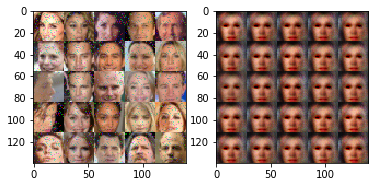

dis_loss: 0.00000643, en_loss: 76.80638885, temp_en_loss_dis: 76.66120911, recon_loss: 0.1452
dis_loss: 0.00000786, en_loss: 77.35846710, temp_en_loss_dis: 77.17542267, recon_loss: 0.1830
dis_loss: 0.00023996, en_loss: 77.82288361, temp_en_loss_dis: 77.63191986, recon_loss: 0.1910
dis_loss: 0.00000955, en_loss: 79.45630646, temp_en_loss_dis: 79.33142090, recon_loss: 0.1249
dis_loss: 0.00000002, en_loss: 80.32955933, temp_en_loss_dis: 80.18119049, recon_loss: 0.1484
dis_loss: 0.00000278, en_loss: 80.29200745, temp_en_loss_dis: 80.13703918, recon_loss: 0.1550
dis_loss: 0.00000064, en_loss: 80.69892120, temp_en_loss_dis: 80.52534485, recon_loss: 0.1736
dis_loss: 0.00003380, en_loss: 81.05017090, temp_en_loss_dis: 80.88237000, recon_loss: 0.1678
dis_loss: 0.00000305, en_loss: 81.20438385, temp_en_loss_dis: 81.12841034, recon_loss: 0.0760
dis_loss: 0.00000003, en_loss: 81.13846588, temp_en_loss_dis: 80.95698547, recon_loss: 0.1815
######### what? the reconstruction mse is: 0.1534


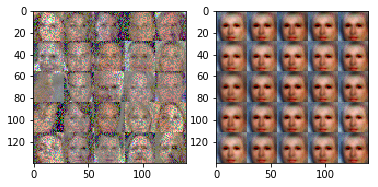

dis_loss: 0.00000825, en_loss: 81.47413635, temp_en_loss_dis: 81.30393982, recon_loss: 0.1702
dis_loss: 0.00001876, en_loss: 83.38737488, temp_en_loss_dis: 83.28881836, recon_loss: 0.0986
dis_loss: 0.00007522, en_loss: 83.17761230, temp_en_loss_dis: 83.00337219, recon_loss: 0.1742
dis_loss: 0.00000041, en_loss: 80.19384766, temp_en_loss_dis: 80.02311707, recon_loss: 0.1707
dis_loss: 0.00007761, en_loss: 81.22867584, temp_en_loss_dis: 81.00585938, recon_loss: 0.2228
dis_loss: 0.00016709, en_loss: 79.62090302, temp_en_loss_dis: 79.44464874, recon_loss: 0.1763
dis_loss: 0.00012236, en_loss: 81.28359985, temp_en_loss_dis: 81.11102295, recon_loss: 0.1726
dis_loss: 0.00000015, en_loss: 82.54034424, temp_en_loss_dis: 82.34304810, recon_loss: 0.1973
dis_loss: 0.00000412, en_loss: 83.11369324, temp_en_loss_dis: 82.95555115, recon_loss: 0.1581
dis_loss: 0.00012595, en_loss: 82.83125305, temp_en_loss_dis: 82.69479370, recon_loss: 0.1365
######### what? the reconstruction mse is: 0.2080


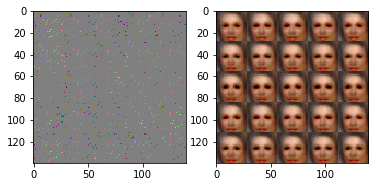

dis_loss: 0.00002133, en_loss: 81.86854553, temp_en_loss_dis: 81.70061493, recon_loss: 0.1679
dis_loss: 0.00000421, en_loss: 82.58705902, temp_en_loss_dis: 82.48949432, recon_loss: 0.0976
dis_loss: 0.00000001, en_loss: 82.56663513, temp_en_loss_dis: 82.41223145, recon_loss: 0.1544
dis_loss: 0.00000000, en_loss: 81.88167572, temp_en_loss_dis: 81.70079041, recon_loss: 0.1809
dis_loss: 0.00000000, en_loss: 82.26587677, temp_en_loss_dis: 82.13170624, recon_loss: 0.1342
dis_loss: 0.00000001, en_loss: 82.98168182, temp_en_loss_dis: 82.78681946, recon_loss: 0.1949
dis_loss: 0.00000001, en_loss: 84.19947052, temp_en_loss_dis: 84.03674316, recon_loss: 0.1627
dis_loss: 0.00000737, en_loss: 83.86794281, temp_en_loss_dis: 83.77316284, recon_loss: 0.0948
dis_loss: 0.00000044, en_loss: 83.30693054, temp_en_loss_dis: 83.19461060, recon_loss: 0.1123
dis_loss: 0.00005081, en_loss: 83.22970581, temp_en_loss_dis: 83.05796814, recon_loss: 0.1717
######### what? the reconstruction mse is: 0.2440


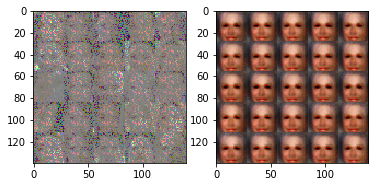

dis_loss: 0.00000002, en_loss: 83.50534821, temp_en_loss_dis: 83.33174896, recon_loss: 0.1736
dis_loss: 0.00001356, en_loss: 83.60174561, temp_en_loss_dis: 83.44580841, recon_loss: 0.1559
dis_loss: 0.00000198, en_loss: 85.72072601, temp_en_loss_dis: 85.57215118, recon_loss: 0.1486
dis_loss: 0.00008920, en_loss: 87.92126465, temp_en_loss_dis: 87.78057861, recon_loss: 0.1407
dis_loss: 0.00000525, en_loss: 87.37921143, temp_en_loss_dis: 87.21705627, recon_loss: 0.1622
dis_loss: 0.00000059, en_loss: 87.61303711, temp_en_loss_dis: 87.47033691, recon_loss: 0.1427
dis_loss: 0.00000264, en_loss: 87.05550385, temp_en_loss_dis: 86.85849762, recon_loss: 0.1970
dis_loss: 0.00001629, en_loss: 85.09685516, temp_en_loss_dis: 84.89055634, recon_loss: 0.2063
dis_loss: 0.00000043, en_loss: 85.81928253, temp_en_loss_dis: 85.63224030, recon_loss: 0.1870
dis_loss: 0.00000025, en_loss: 85.65358734, temp_en_loss_dis: 85.45168304, recon_loss: 0.2019
######### what? the reconstruction mse is: 0.2511


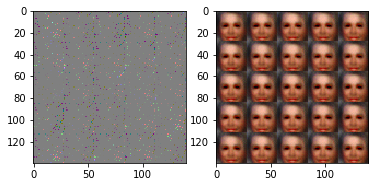

dis_loss: 0.00025689, en_loss: 85.76953125, temp_en_loss_dis: 85.61360168, recon_loss: 0.1559
dis_loss: 0.00000021, en_loss: 85.53978729, temp_en_loss_dis: 85.33261108, recon_loss: 0.2072
dis_loss: 0.00000015, en_loss: 85.41388702, temp_en_loss_dis: 85.20255280, recon_loss: 0.2113
dis_loss: 0.00000018, en_loss: 87.18701935, temp_en_loss_dis: 87.00428009, recon_loss: 0.1827
dis_loss: 0.00000498, en_loss: 87.59617615, temp_en_loss_dis: 87.38900757, recon_loss: 0.2072
dis_loss: 0.00000003, en_loss: 85.87435150, temp_en_loss_dis: 85.70957947, recon_loss: 0.1648
dis_loss: 0.00000032, en_loss: 85.78199768, temp_en_loss_dis: 85.62030792, recon_loss: 0.1617
dis_loss: 0.00001647, en_loss: 86.80451202, temp_en_loss_dis: 86.65664673, recon_loss: 0.1479
dis_loss: 0.00002206, en_loss: 86.19017029, temp_en_loss_dis: 86.03800964, recon_loss: 0.1522
dis_loss: 0.00001685, en_loss: 85.94019318, temp_en_loss_dis: 85.76223755, recon_loss: 0.1780
######### what? the reconstruction mse is: 0.2301


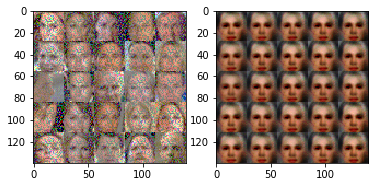

dis_loss: 0.00000017, en_loss: 86.76583862, temp_en_loss_dis: 86.59796143, recon_loss: 0.1679
dis_loss: 0.00003614, en_loss: 84.52826691, temp_en_loss_dis: 84.39161682, recon_loss: 0.1366
dis_loss: 0.00000081, en_loss: 85.20148468, temp_en_loss_dis: 85.04301453, recon_loss: 0.1585
dis_loss: 0.00010684, en_loss: 83.61623383, temp_en_loss_dis: 83.45625305, recon_loss: 0.1600
dis_loss: 0.00000393, en_loss: 85.81548309, temp_en_loss_dis: 85.69867706, recon_loss: 0.1168
dis_loss: 0.00000016, en_loss: 85.43881226, temp_en_loss_dis: 85.24512482, recon_loss: 0.1937
dis_loss: 0.00003359, en_loss: 86.32915497, temp_en_loss_dis: 86.13077545, recon_loss: 0.1984
dis_loss: 0.00000003, en_loss: 86.42921448, temp_en_loss_dis: 86.29351807, recon_loss: 0.1357
dis_loss: 0.00000010, en_loss: 86.84990692, temp_en_loss_dis: 86.68176270, recon_loss: 0.1681
dis_loss: 0.00004629, en_loss: 87.21436310, temp_en_loss_dis: 87.06555939, recon_loss: 0.1488
######### what? the reconstruction mse is: 0.2149


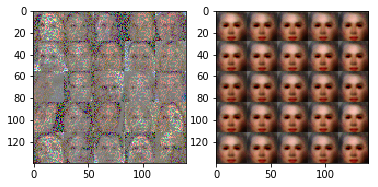

dis_loss: 0.00000652, en_loss: 88.93769836, temp_en_loss_dis: 88.77421570, recon_loss: 0.1635
dis_loss: 0.00022137, en_loss: 87.83648682, temp_en_loss_dis: 87.64230347, recon_loss: 0.1942
dis_loss: 0.00000096, en_loss: 88.40837860, temp_en_loss_dis: 88.26340485, recon_loss: 0.1450
dis_loss: 0.00000001, en_loss: 88.94657898, temp_en_loss_dis: 88.77665710, recon_loss: 0.1699
dis_loss: 0.00000000, en_loss: 89.67711639, temp_en_loss_dis: 89.54867554, recon_loss: 0.1284
dis_loss: 0.00004387, en_loss: 88.72090912, temp_en_loss_dis: 88.52098083, recon_loss: 0.1999
dis_loss: 0.00004001, en_loss: 86.92687988, temp_en_loss_dis: 86.73973846, recon_loss: 0.1871
dis_loss: 0.00001215, en_loss: 85.17545319, temp_en_loss_dis: 84.99595642, recon_loss: 0.1795
dis_loss: 0.00010004, en_loss: 86.28456879, temp_en_loss_dis: 86.11952209, recon_loss: 0.1650
dis_loss: 0.00027852, en_loss: 86.93991089, temp_en_loss_dis: 86.79090881, recon_loss: 0.1490
######### what? the reconstruction mse is: 0.2099


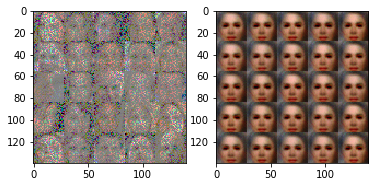

dis_loss: 0.00001290, en_loss: 87.61734009, temp_en_loss_dis: 87.41756439, recon_loss: 0.1998
dis_loss: 0.00000167, en_loss: 87.71397400, temp_en_loss_dis: 87.53701019, recon_loss: 0.1770
dis_loss: 0.00009116, en_loss: 87.83187866, temp_en_loss_dis: 87.64944458, recon_loss: 0.1824
dis_loss: 0.00004547, en_loss: 88.49230194, temp_en_loss_dis: 88.34219360, recon_loss: 0.1501
dis_loss: 0.00000002, en_loss: 89.55115509, temp_en_loss_dis: 89.45481873, recon_loss: 0.0963
dis_loss: 0.00000461, en_loss: 90.02298737, temp_en_loss_dis: 89.84727478, recon_loss: 0.1757
dis_loss: 0.00000004, en_loss: 89.82238007, temp_en_loss_dis: 89.61908722, recon_loss: 0.2033
dis_loss: 0.00002559, en_loss: 90.94940186, temp_en_loss_dis: 90.77642822, recon_loss: 0.1730
dis_loss: 0.00000207, en_loss: 91.81895447, temp_en_loss_dis: 91.65882874, recon_loss: 0.1601
dis_loss: 0.00001542, en_loss: 88.29700470, temp_en_loss_dis: 88.09226227, recon_loss: 0.2047
######### what? the reconstruction mse is: 0.2548


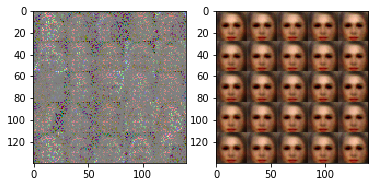

dis_loss: 0.00003970, en_loss: 89.55046844, temp_en_loss_dis: 89.37160492, recon_loss: 0.1789
dis_loss: 0.00000011, en_loss: 89.81278229, temp_en_loss_dis: 89.67956543, recon_loss: 0.1332
dis_loss: 0.00000977, en_loss: 88.72164154, temp_en_loss_dis: 88.47741699, recon_loss: 0.2442
dis_loss: 0.00000683, en_loss: 89.67091370, temp_en_loss_dis: 89.49573517, recon_loss: 0.1752
dis_loss: 0.00000001, en_loss: 90.68614197, temp_en_loss_dis: 90.51841736, recon_loss: 0.1677
dis_loss: 0.00002626, en_loss: 90.97016144, temp_en_loss_dis: 90.79439545, recon_loss: 0.1758
dis_loss: 0.00000000, en_loss: 88.53024292, temp_en_loss_dis: 88.33998108, recon_loss: 0.1903
dis_loss: 0.00000014, en_loss: 88.07043457, temp_en_loss_dis: 87.90747070, recon_loss: 0.1630
dis_loss: 0.00007819, en_loss: 88.41473389, temp_en_loss_dis: 88.17410278, recon_loss: 0.2406
dis_loss: 0.00002206, en_loss: 88.35639191, temp_en_loss_dis: 88.17028046, recon_loss: 0.1861
######### what? the reconstruction mse is: 0.2869


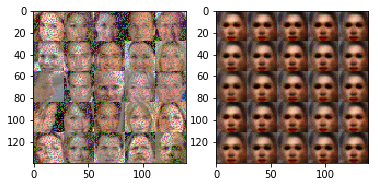

dis_loss: 0.00002033, en_loss: 89.53048706, temp_en_loss_dis: 89.37657166, recon_loss: 0.1539
dis_loss: 0.00002051, en_loss: 89.44784546, temp_en_loss_dis: 89.27607727, recon_loss: 0.1718
dis_loss: 0.00002939, en_loss: 92.48362732, temp_en_loss_dis: 92.36579895, recon_loss: 0.1178
dis_loss: 0.00000018, en_loss: 92.23976135, temp_en_loss_dis: 92.06449890, recon_loss: 0.1753
dis_loss: 0.00000225, en_loss: 92.26171875, temp_en_loss_dis: 92.10071564, recon_loss: 0.1610
dis_loss: 0.00005875, en_loss: 92.61642456, temp_en_loss_dis: 92.52075195, recon_loss: 0.0957
dis_loss: 0.00003056, en_loss: 91.77749634, temp_en_loss_dis: 91.64887238, recon_loss: 0.1286
dis_loss: 0.00005982, en_loss: 93.07144165, temp_en_loss_dis: 92.89684296, recon_loss: 0.1746
dis_loss: 0.00000530, en_loss: 92.22641754, temp_en_loss_dis: 92.06539917, recon_loss: 0.1610
dis_loss: 0.00000294, en_loss: 92.12982178, temp_en_loss_dis: 91.96466064, recon_loss: 0.1652
######### what? the reconstruction mse is: 0.2671


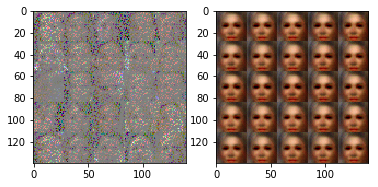

dis_loss: 0.00000002, en_loss: 91.93526459, temp_en_loss_dis: 91.73887634, recon_loss: 0.1964
dis_loss: 0.00000150, en_loss: 93.21807098, temp_en_loss_dis: 93.07360077, recon_loss: 0.1445


KeyboardInterrupt: 

In [20]:
batch_size = 32
learning_rate = 0.0002
beta1 = 0.5
beta2 = 0.9
M = 5
z_dim = 100
tf.reset_default_graph()
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2
sample_set = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:25])
sample_images = next(sample_set.get_batches(25))

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[25:])
print(celeba_dataset.shape)

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, beta2, M, celeba_dataset.get_batches, 
         sample_images, celeba_dataset.shape, celeba_dataset.image_mode)


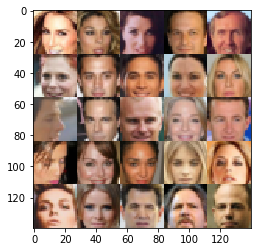

In [52]:
cmap = None
sample_images_grid = helper.images_square_grid(sample_images, celeba_dataset.image_mode)
pyplot.imshow(sample_images_grid, cmap=cmap)
pyplot.show()